<a href="https://colab.research.google.com/github/Miguellabra/Study-of-Complex-Systems/blob/main/Study_of_Complex_Systems_through_TimeSeries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries and Data Load

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
import itertools
warnings.filterwarnings("ignore")

import os
from google.colab import drive

plt.style.use('ggplot')
%matplotlib inline

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataset_path = '/content/drive/MyDrive/DataTesis/'
dataset_name = 'data.csv'

file_path = os.path.join(dataset_path, dataset_name)
data = pd.read_csv(file_path, index_col=0, parse_dates=True)

print("The size of the data set is: ", data.shape)

The size of the data set is:  (4211, 326)


In [ ]:
data.head(3)

,AAP_CD,AMZN_CD,AZO_CD,BBY_CD,BKNG_CD,CCL_CD,CMCSA_CD,DHI_CD,DISH_CD,DLTR_CD,...,LNT_UT,NEE_UT,NI_UT,NRG_UT,PEG_UT,PNW_UT,SO_UT,SRE_UT,WEC_UT,XEL_UT
2006-01-03,43.470001,2.3735,91.849998,43.750000,22.320000,53.830002,8.683333,36.459999,27.230000,7.990000,...,14.09,10.4650,8.247544,23.700001,32.750000,41.599998,34.759998,45.040001,19.650000,18.520000
2006-01-04,43.900002,2.3745,92.760002,44.599998,22.750000,54.419998,8.710000,36.830002,28.180000,8.043333,...,14.26,10.5250,8.361493,23.950001,33.375000,42.389999,34.919998,46.250000,20.049999,18.570000
2006-01-05,43.840000,2.3580,91.760002,44.099998,22.940001,54.380001,8.793333,36.400002,28.719999,8.116667,...,14.39,10.4625,8.259332,23.250000,33.450001,42.450001,35.040001,47.000000,19.985001,18.610001


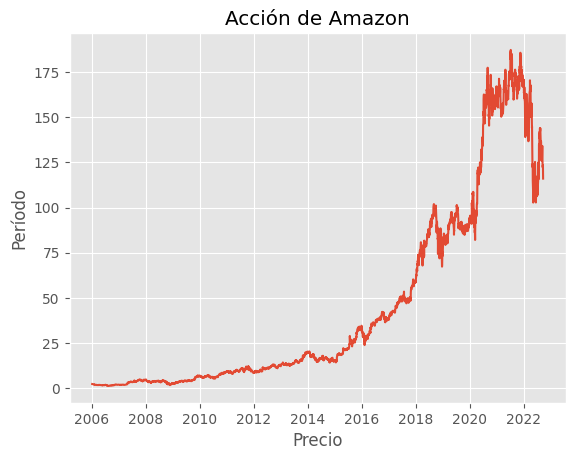

In [ ]:
plt.plot(figsize=(10,6))
plt.plot(data['AMZN_CD'])
plt.title('Acción de Amazon')
plt.xlabel('Precio')
plt.ylabel('Período')
plt.show()

In [ ]:
stock_names = data.columns.tolist()

In [ ]:
X = data
T,N = X.shape
q = 20
e = 0.6

# Part 1: Correlation Matrices

Function to create the correlation matrices with specific size, power-mapping parameter and shifting days:

In [ ]:
def CorrMatrices(epoch_size,epsilon,shift):
  epochs = []
  labels = []
  std = []

  num_epochs = len(data)- epoch_size + 1
  for i in range(num_epochs):
    start_idx = i*shift
    end_idx = start_idx + epoch_size
    epoch = data.iloc[start_idx:end_idx]
    label = data.index[start_idx].strftime("%Y-%m-%d") #+ "  :  " + df.index[end_idx].strftime("%Y-%m-%d")
    labels.append(label)
    epochs.append(epoch)
    epochs[i] = pd.DataFrame(np.diff(np.log(epochs[i]),axis=0),index=epochs[i].index[1:],columns=epochs[i].columns)
    std_epochs = np.std(epochs[i])
    std.append(std_epochs)
    epochs[i] = epochs[i].corr(method='pearson')
    epochs[i] = (epochs[i].abs()**(1+epsilon))*(epochs[i]/epochs[i])
  return epochs, num_epochs, labels, std

Function to inizialice the kmeans algorithm with k range from 4 to 15.

In [ ]:
def Cluster(data):
  inertia = []
  k_range = range(4,10)
  for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=5)
    kmeans.fit(data)
    inertia.append(kmeans.inertia_)
  return inertia, k_range

Function to visualize correlation matrices:

In [ ]:
def Visualize_Mat(i):
  plt.figure(figsize=(8,6)) #(10,8)
  sns.heatmap(epochs[i], cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"{labels[i]}")

In [ ]:
epochs, num_epochs, labels, std = CorrMatrices(q,e,1)

I directly apply the kmeans clustering over the epochs. In the code below, I subtract the upper triangle matrix from each epoch, then I give the proper format to use it as input to the kmeans algorithm.

In [ ]:
mt = []
for i in range(num_epochs):
  np_array = epochs[i].to_numpy()
  row_indices, col_indices = np.triu_indices(N,1)
  upper_triangular_values = np_array[row_indices, col_indices]
  mt.append(upper_triangular_values)

In [ ]:
stacked_array = np.column_stack(mt)
stacked_array.shape

In [ ]:
UpperTriangularValues = stacked_array

In [ ]:
UpperTriangularValues = np.load("/content/drive/MyDrive/DataTesis/UpperTriangularValues.npy")

In [ ]:
# np.save('UpperTriangularValues.npy', stacked_array)

By default, kmeans clustering algorithm assums that the rows of the data set are the instances while the columns represent the variables. Because of that reason, it is necessary to take the transpose of the "UpperTriangularValues" array.

In [ ]:
UpperTriangularValues = UpperTriangularValues.T
UpperTriangularValues.shape

(4191, 52975)

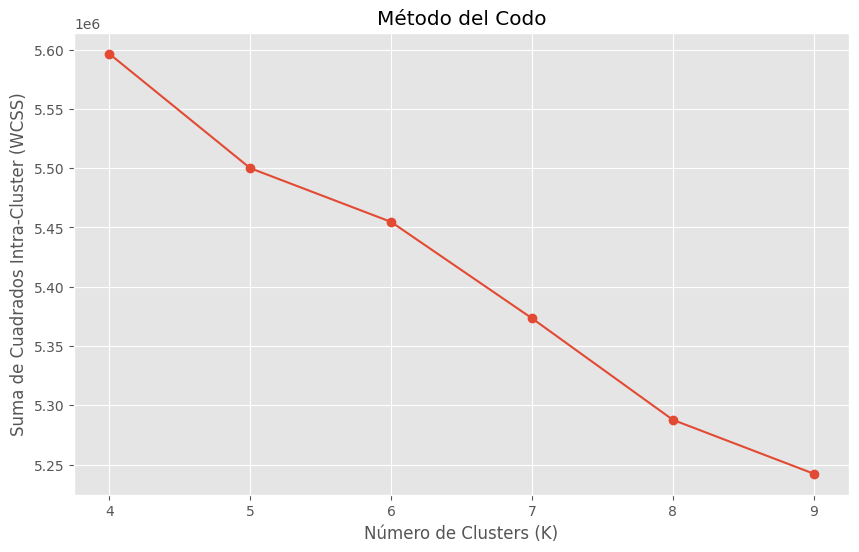

In [ ]:
inertia, k_range = Cluster(UpperTriangularValues)

plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia, marker='o', linestyle='-')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Suma de Cuadrados Intra-Cluster (WCSS)')
plt.title('Método del Codo')
plt.grid(True)
plt.show()

In [ ]:
k_range = range(4,10)

kmeans_per_k = [KMeans(n_clusters=k, n_init='auto', random_state=5).fit(UpperTriangularValues)
                for k in k_range]

inertias = [model.inertia_ for model in kmeans_per_k]

silhouette_scores = [silhouette_score(UpperTriangularValues, model.labels_)
                      for model in kmeans_per_k]

In [ ]:
len(silhouette_scores)

6

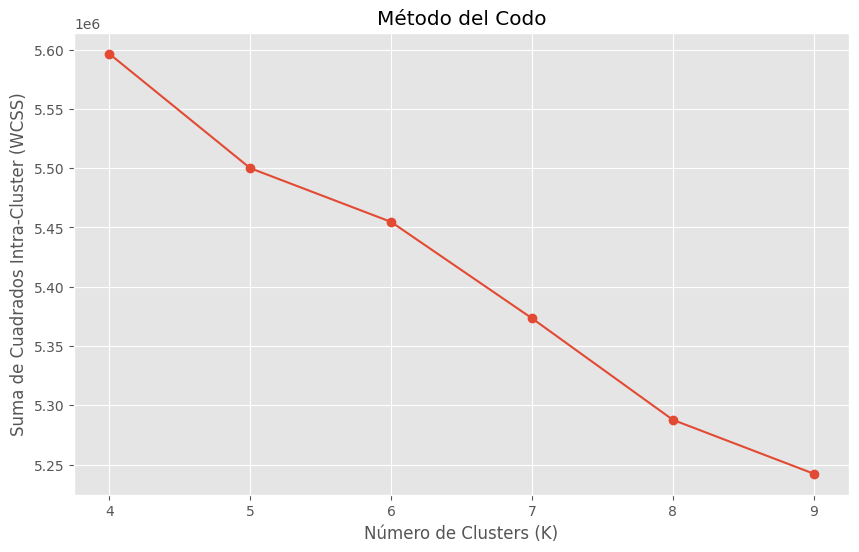

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(k_range, inertias, marker='o', linestyle='-')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Suma de Cuadrados Intra-Cluster (WCSS)')
plt.title('Método del Codo')

plt.show()

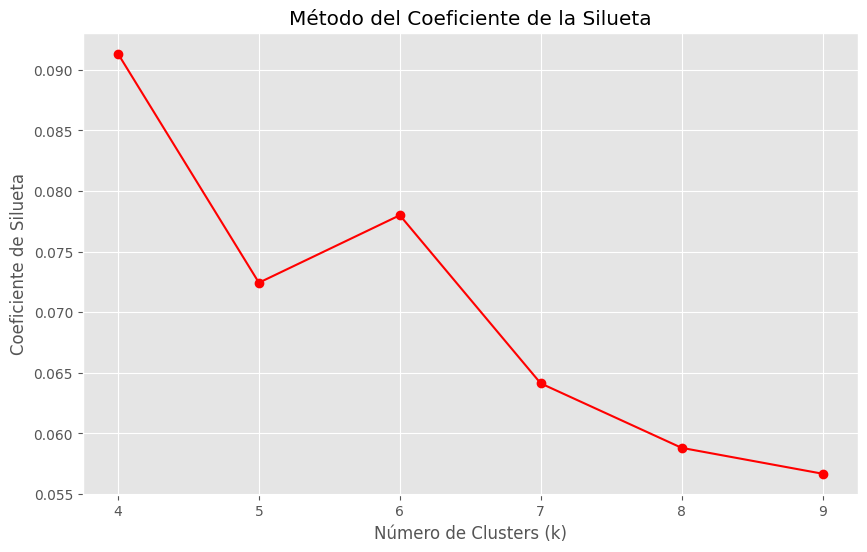

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, "ro-")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Coeficiente de Silueta")
plt.title("Método del Coeficiente de la Silueta")

plt.show()

After choosing the optimal number of clusters I perform the segmentation process.

In [ ]:
kmeans = KMeans(n_clusters=5, n_init='auto', random_state=5)

kmeans.fit(UpperTriangularValues)

KMeans(n_clusters=5, n_init='auto', random_state=5)

In [ ]:
c_labels = kmeans.labels_
centroids = kmeans.cluster_centers_

df_labels = pd.DataFrame(c_labels, columns=['Cluster'])

In [ ]:
unique_counts = df_labels.value_counts()
unique_counts

Cluster
0          1631
2          1360
4           661
1           425
3           114
Name: count, dtype: int64

Market states.

In [ ]:
mean_correlation_matrices = {}
highest_eigenvalues = {}
mean_values = {}

for label in np.unique(df_labels):
    indices = np.where(df_labels == label)[0]


    corrmat = [epochs[i] for i in indices]

    mean_correlation_matrix = np.mean(corrmat, axis=0)
    mean_correlation_matrices[label] = mean_correlation_matrix

    eigenvalues, _ = np.linalg.eig(mean_correlation_matrix)
    highest_eigenvalue = np.max(eigenvalues)
    highest_eigenvalues[label] = highest_eigenvalue

    # Calculate mean value
    flattened_matrix = mean_correlation_matrix.flatten()
    mean_value = np.mean(flattened_matrix)
    mean_values[label] = mean_value


In [ ]:
for label in mean_correlation_matrices:
    print(f"Label {label}:")
    print("Mean Correlation Matrix:")
    print(mean_correlation_matrices[label])
    print("Highest Eigenvalue:", highest_eigenvalues[label])
    print("Mean Value:", mean_values[label])
    print()

Label 0:
Mean Correlation Matrix:
[[1.         0.12842629 0.39674917 ... 0.10518677 0.10666007 0.09915928]
 [0.12842629 1.         0.16403996 ... 0.08261459 0.0926422  0.10635934]
 [0.39674917 0.16403996 1.         ... 0.12224154 0.12471277 0.12662002]
 ...
 [0.10518677 0.08261459 0.12224154 ... 1.         0.42930571 0.43407759]
 [0.10666007 0.0926422  0.12471277 ... 0.42930571 1.         0.60079181]
 [0.09915928 0.10635934 0.12662002 ... 0.43407759 0.60079181 1.        ]]
Highest Eigenvalue: 48.482851196744654
Mean Value: 0.14635483414722503

Label 1:
Mean Correlation Matrix:
[[1.         0.27853159 0.53246848 ... 0.28725373 0.25432864 0.28199262]
 [0.27853159 1.         0.26300137 ... 0.24237296 0.22852837 0.26832951]
 [0.53246848 0.26300137 1.         ... 0.31059927 0.29984295 0.30623374]
 ...
 [0.28725373 0.24237296 0.31059927 ... 1.         0.56208992 0.5213074 ]
 [0.25432864 0.22852837 0.29984295 ... 0.56208992 1.         0.70157061]
 [0.28199262 0.26832951 0.30623374 ... 0.52130

In [ ]:
mean_correlation_matrix_df1 = pd.DataFrame(mean_correlation_matrices[0], index=stock_names, columns=stock_names)
mean_correlation_matrix_df2 = pd.DataFrame(mean_correlation_matrices[2], index=stock_names, columns=stock_names)
mean_correlation_matrix_df3 = pd.DataFrame(mean_correlation_matrices[4], index=stock_names, columns=stock_names)
mean_correlation_matrix_df4 = pd.DataFrame(mean_correlation_matrices[1], index=stock_names, columns=stock_names)
mean_correlation_matrix_df5 = pd.DataFrame(mean_correlation_matrices[3], index=stock_names, columns=stock_names)

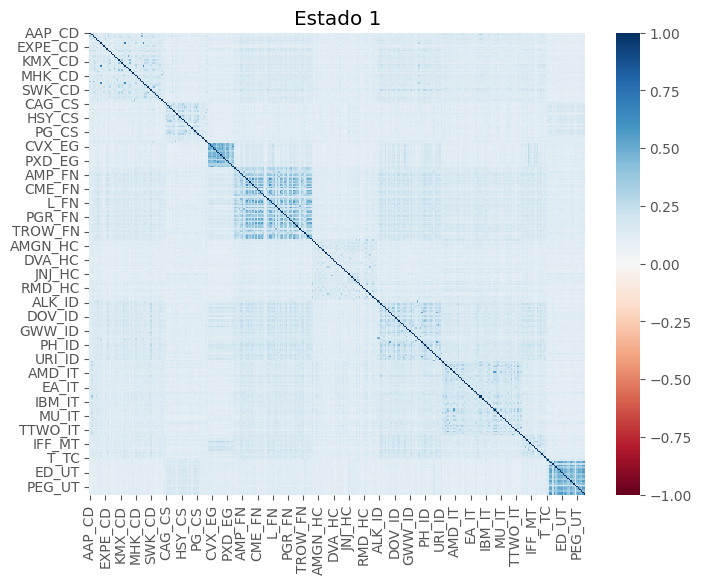

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(mean_correlation_matrix_df1, cmap='RdBu', vmin=-1.0, vmax=1.0)
plt.title("Estado 1")
plt.savefig('Estado_1.png')
plt.show()

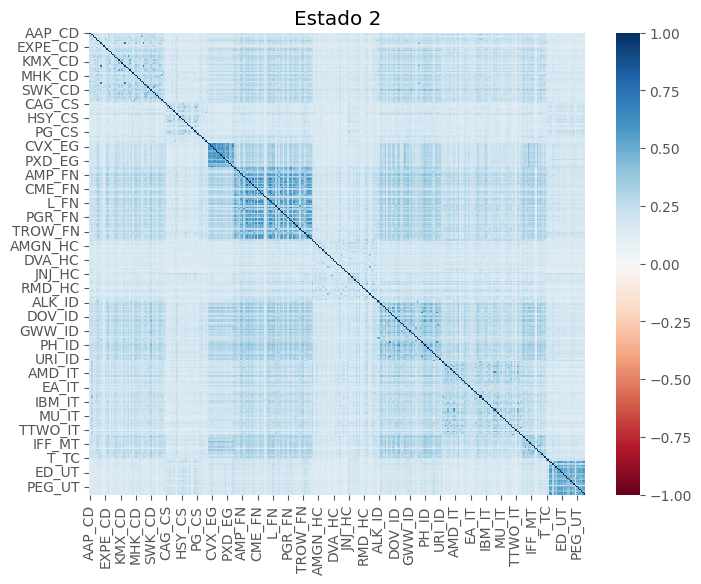

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(mean_correlation_matrix_df2, cmap='RdBu', vmin=-1.0, vmax=1.0)
plt.title("Estado 2")
plt.savefig('Estado_2.png')
plt.show()

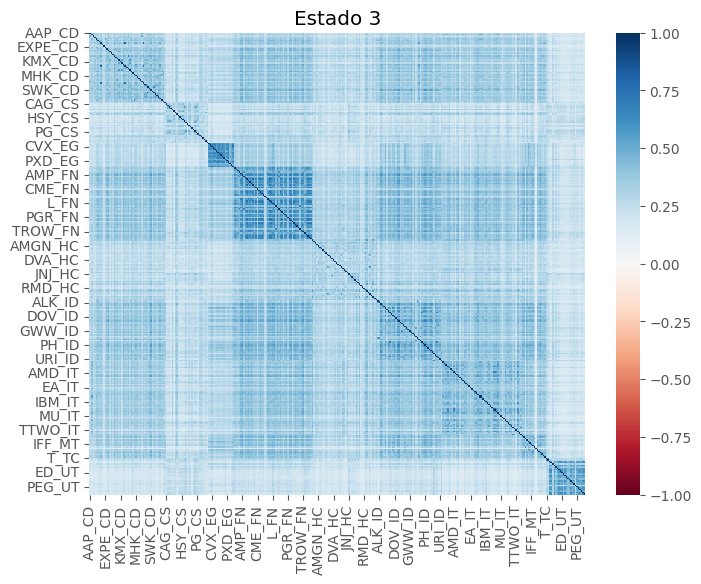

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(mean_correlation_matrix_df3, cmap='RdBu', vmin=-1.0, vmax=1.0)
plt.title("Estado 3")
plt.savefig('Estado_3.png')
plt.show()

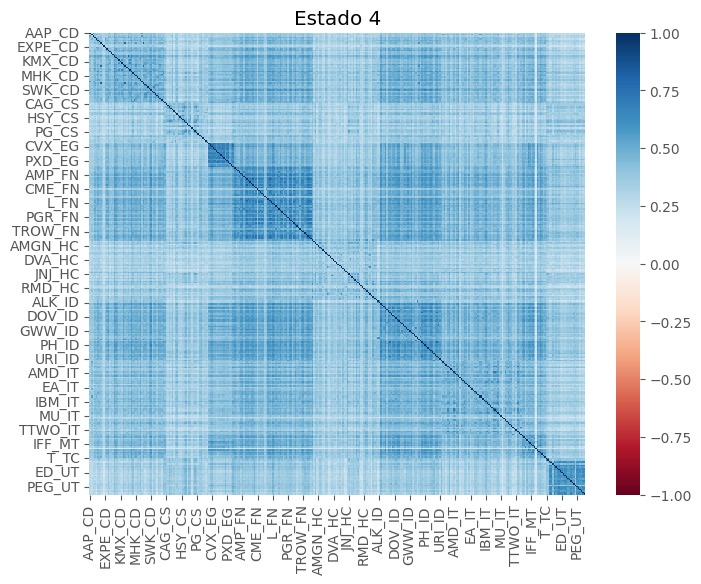

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(mean_correlation_matrix_df4, cmap='RdBu', vmin=-1.0, vmax=1.0)
plt.title("Estado 4")
plt.savefig('Estado_4.png')
plt.show()

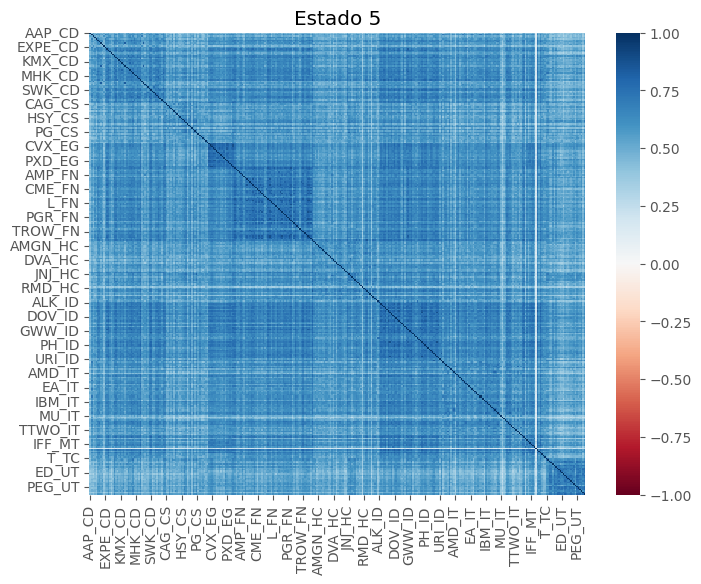

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(mean_correlation_matrix_df5, cmap='RdBu', vmin=-1.0, vmax=1.0)
plt.title("Estado 5")
plt.savefig('Estado_5.png')
plt.show()

In [ ]:
df_labels_final = df_labels.replace({'Cluster':{0:1, 1:4, 2:2, 3:5, 4:3}})
df_labels_final.head(5)

,Cluster
0,1
1,1
2,1
3,1
4,1


In [ ]:
df_labels_final.to_csv('clusters.csv', index=True)

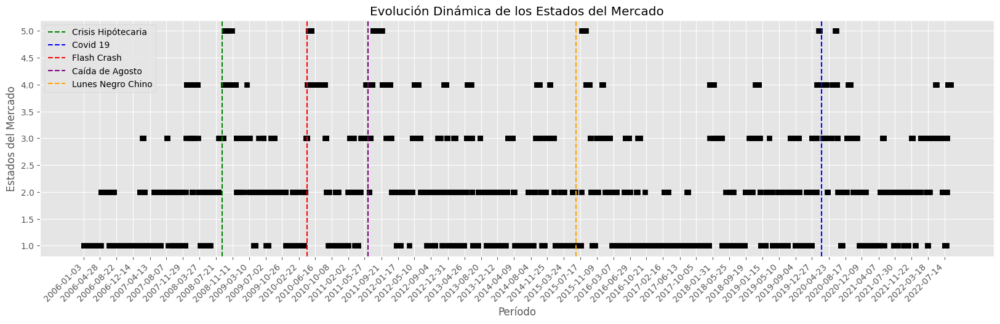

In [ ]:
x_ticks = data.index[:4191:80]

plt.figure(figsize=(20, 5))
plt.scatter(data.index[:4191], df_labels_final.Cluster, marker='s', color='black')
plt.axvline(x=data.index[670], color='green', linestyle='--', label='Crisis Hipótecaria') # Mortage Meltdown
plt.axvline(x=data.index[3563], color='blue', linestyle='--', label='Covid 19') # Flash Crash
plt.axvline(x=data.index[1080], color='red', linestyle='--', label='Flash Crash')  # Covid 19
plt.axvline(x=data.index[1375], color='purple', linestyle='--', label='Caída de Agosto') # August 2011 Fall
plt.axvline(x=data.index[2380], color='orange', linestyle='--', label='Lunes Negro Chino') # Chinese Black Monday
plt.xticks(x_ticks, rotation=45, ha='right');
plt.xlabel("Período")
plt.ylabel("Estados de Mercado")
plt.legend()
plt.title("Evolución Dinámica de los Estados del Mercado");

In [ ]:
#df_labels_final = pd.read_csv('clusters.csv')
#df_labels_final.drop(columns='Unnamed: 0', inplace=True)
#df_labels_final.head(3)

,Cluster
0,1
1,1
2,1


In [ ]:
states = [1,2,3,4,5]
state_sequence = df_labels_final['Cluster'].tolist()

In [ ]:
num_states = len(states)
transition_matrix = np.zeros((num_states, num_states))

for i in range(len(state_sequence) - 1):
    current_state = states.index(state_sequence[i])
    next_state = states.index(state_sequence[i + 1])
    transition_matrix[current_state, next_state] += 1

row_sums = transition_matrix.sum(axis=1, keepdims=True)
transition_matrix_normalized = transition_matrix / row_sums

#print("Transition Matrix:\n", transition_matrix)
#print("Transition Matrix Probabilities:\n",transition_matrix_normalized)

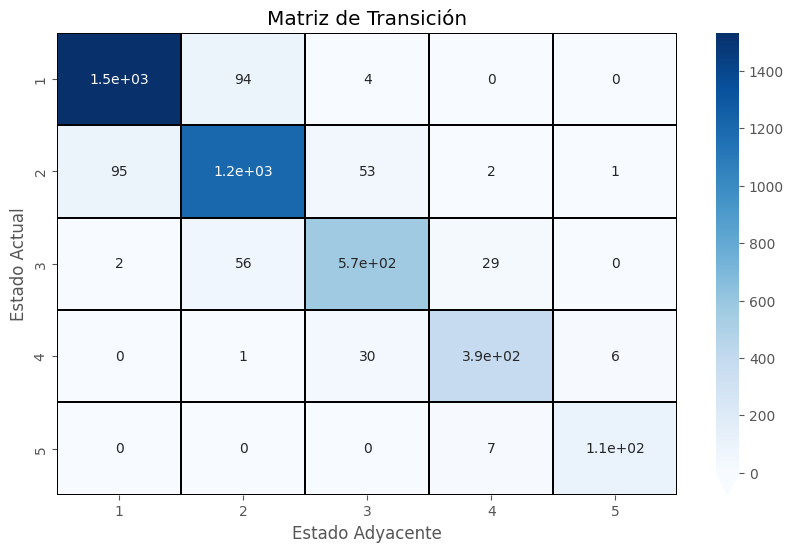

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(transition_matrix,annot=True, cmap='Blues', xticklabels=states, yticklabels=states, linewidths=0.2, linecolor='black', cbar_kws={"extend": "min"})
plt.xlabel("Estado Adyacente")
plt.ylabel("Estado Actual")
plt.title("Matriz de Transición")
plt.show()

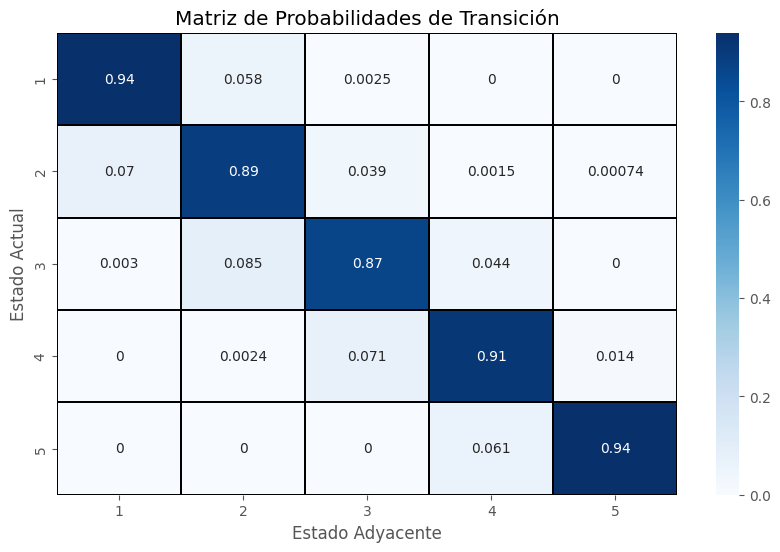

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(transition_matrix_normalized, annot=True, cmap='Blues', xticklabels=states, yticklabels=states, linewidths=0.2, linecolor='black')
plt.xlabel("Estado Adyacente")
plt.ylabel("Estado Actual")
plt.title("Matriz de Probabilidades de Transición")
plt.show()

# Part 2: SVD and PCA


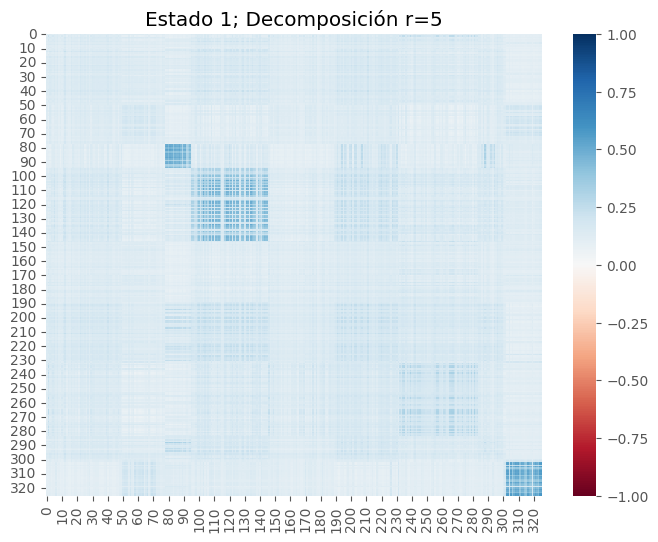

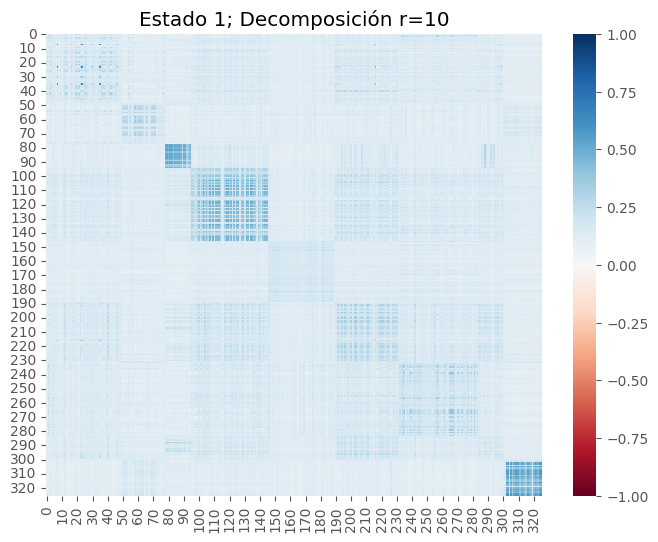

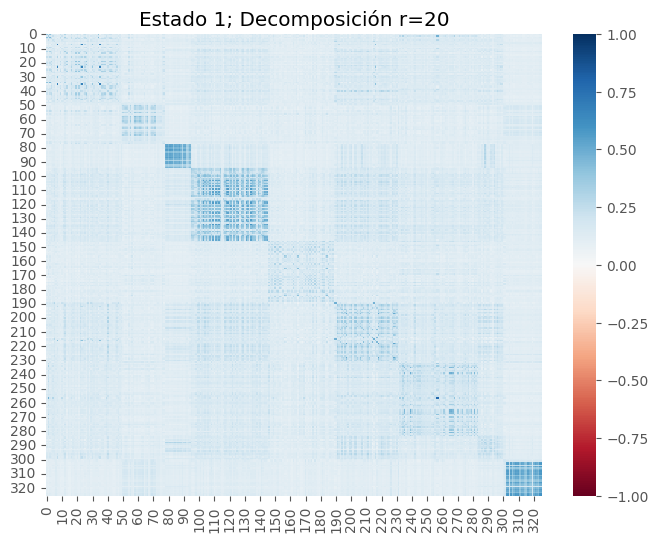

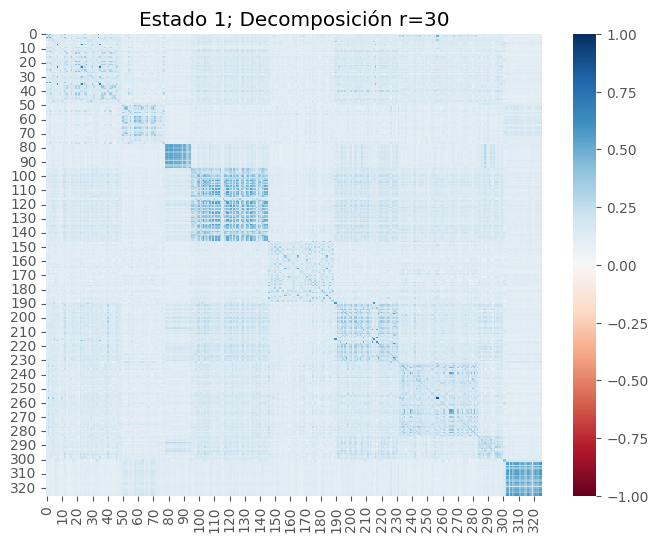

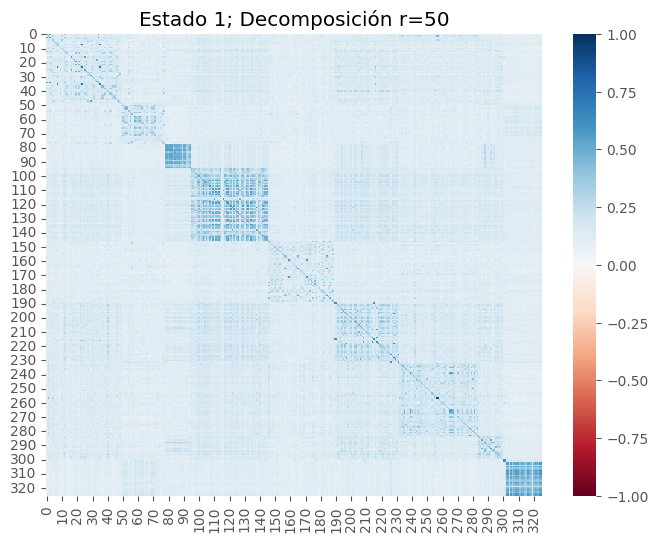

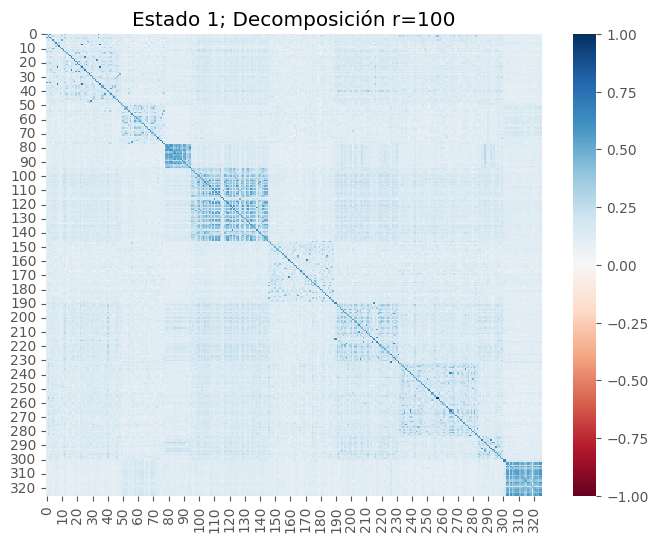

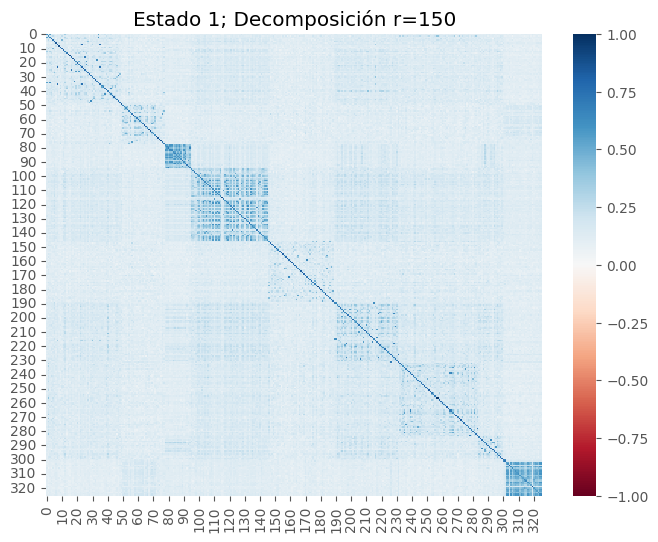

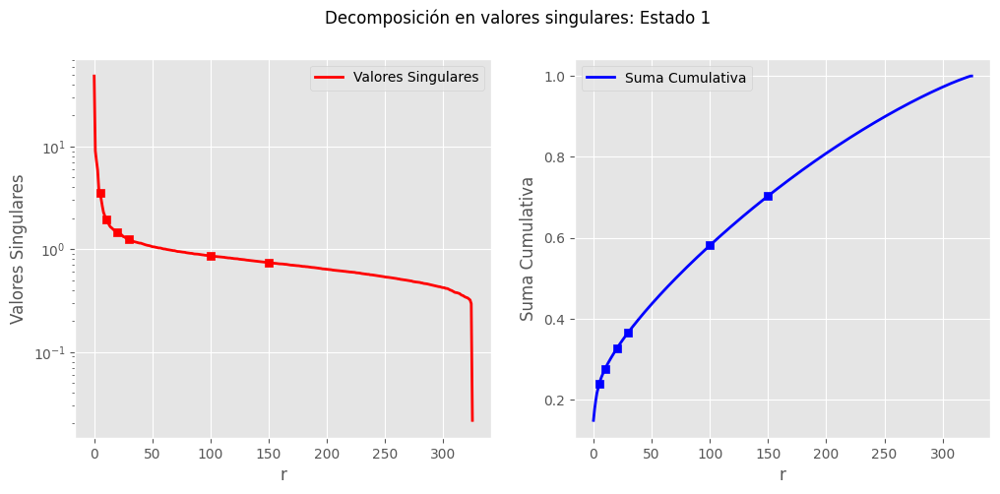

In [ ]:
U, S, VT = np.linalg.svd(mean_correlation_matrix_df1, full_matrices=False)

S = np.diag(S)

for r in (5, 10, 20, 30, 50, 100, 150):
  Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
  plt.figure(figsize=(8,6))
  sns.heatmap(Xapprox, cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"Estado 1; Decomposición r={r}")
  plt.savefig(f'estado_1_SVDr{r}.png')
  plt.show()



scatter_points = [5, 10, 20, 30, 50, 100, 150]
scatter_values = [S[point][point] for point in scatter_points]
scatter_values_2 = [(np.cumsum(np.diag(S))/np.sum(np.diag(S)))[point] for point in scatter_points]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(scatter_points, scatter_values, marker='s', color='red')
plt.semilogy(np.diag(S), linewidth=2, color='red', label='Valores Singulares')
plt.legend()
plt.ylabel('Valores Singulares')
plt.xlabel('r');

plt.subplot(1, 2, 2)
plt.scatter(scatter_points, scatter_values_2, marker='s', color='blue')
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)), linewidth=2, color='blue', label='Suma Cumulativa')
plt.legend()
plt.ylabel('Suma Cumulativa')
plt.xlabel('r');

plt.suptitle('Decomposición en valores singulares: Estado 1')
plt.savefig('SVD_Estado_1.png')

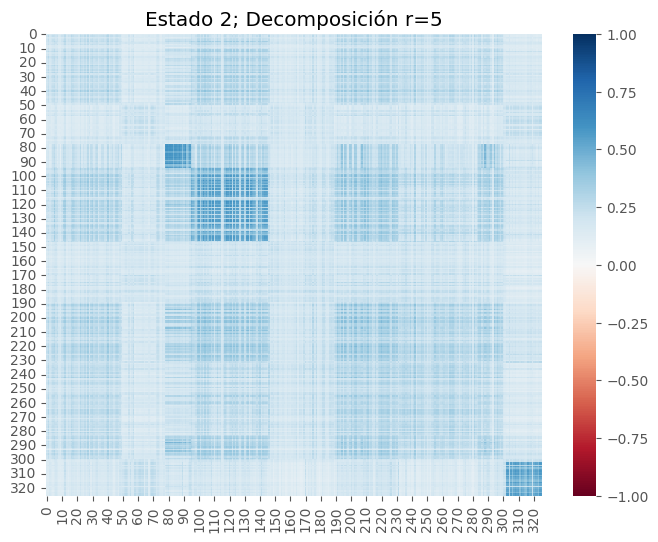

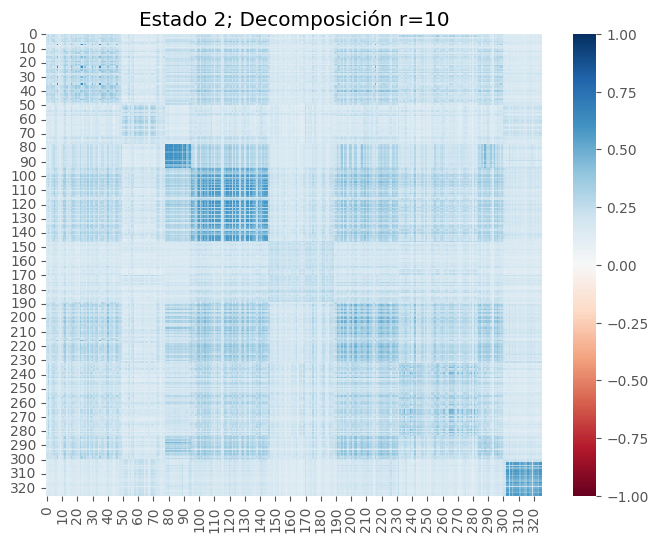

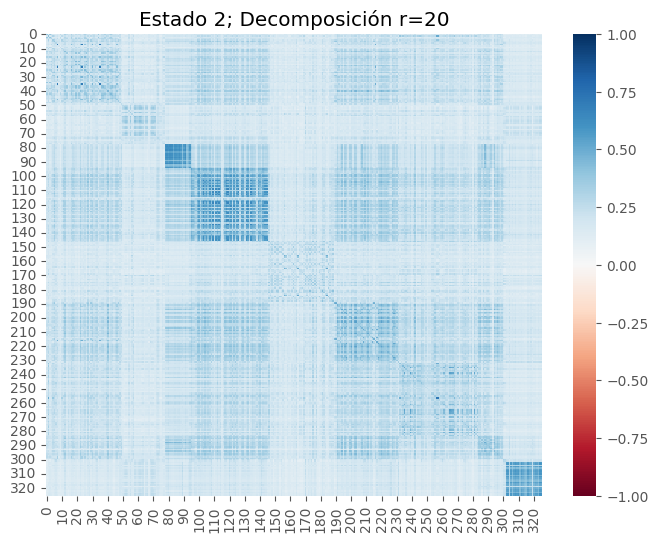

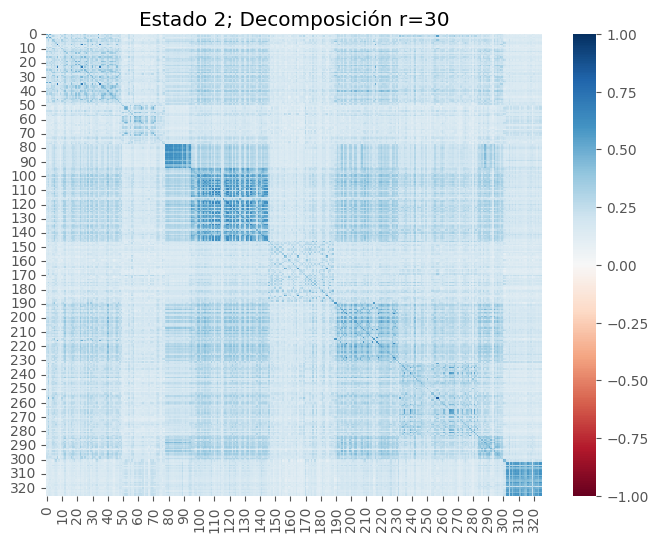

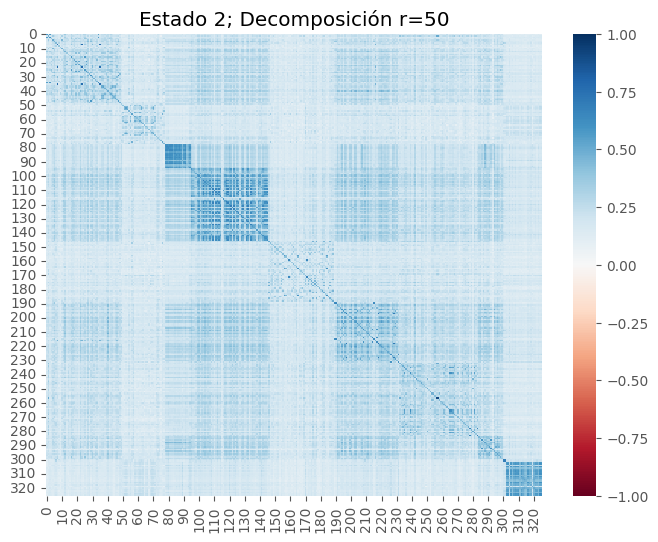

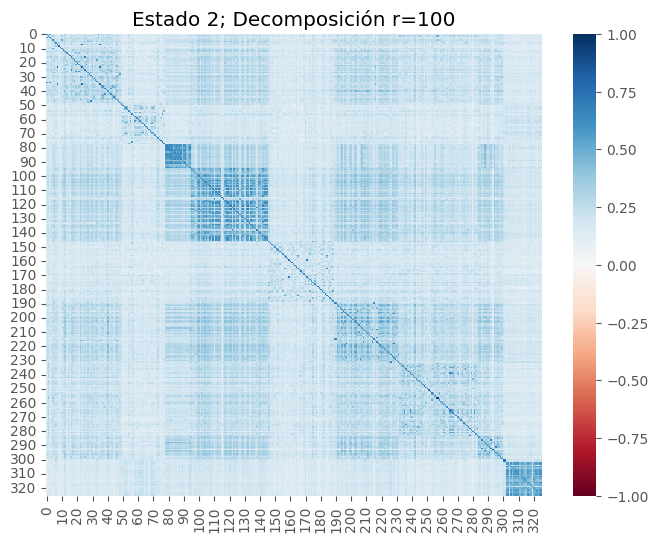

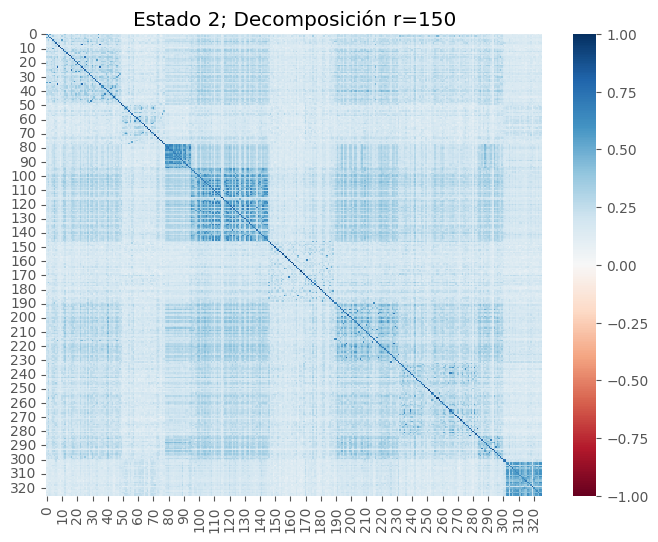

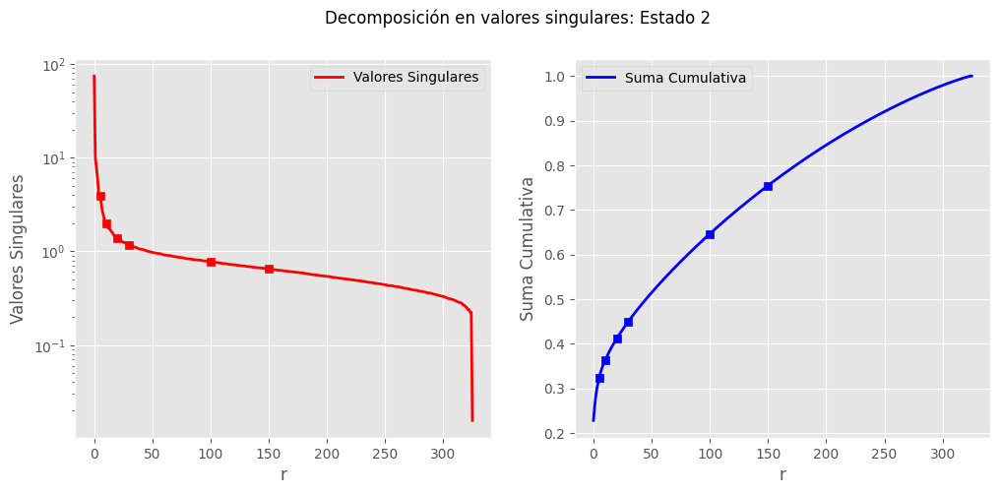

In [ ]:
U, S, VT = np.linalg.svd(mean_correlation_matrix_df3, full_matrices=False)

S = np.diag(S)

for r in (5, 10, 20, 30, 50, 100, 150):
  Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
  plt.figure(figsize=(8,6))
  sns.heatmap(Xapprox, cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"Estado 2; Decomposición r={r}")
  plt.savefig(f'estado_2_SVDr{r}.png')
  plt.show()



scatter_points = [5, 10, 20, 30, 100, 150]
scatter_values = [S[point][point] for point in scatter_points]
scatter_values_2 = [(np.cumsum(np.diag(S))/np.sum(np.diag(S)))[point] for point in scatter_points]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(scatter_points, scatter_values, marker='s', color='red')
plt.semilogy(np.diag(S), linewidth=2, color='red', label='Valores Singulares')
plt.legend()
plt.ylabel('Valores Singulares')
plt.xlabel('r');

plt.subplot(1, 2, 2)
plt.scatter(scatter_points, scatter_values_2, marker='s', color='blue')
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)), linewidth=2, color='blue', label='Suma Cumulativa')
plt.legend()
plt.ylabel('Suma Cumulativa')
plt.xlabel('r');

plt.suptitle('Decomposición en valores singulares: Estado 2');
plt.savefig('SVD_Estado_2.png')

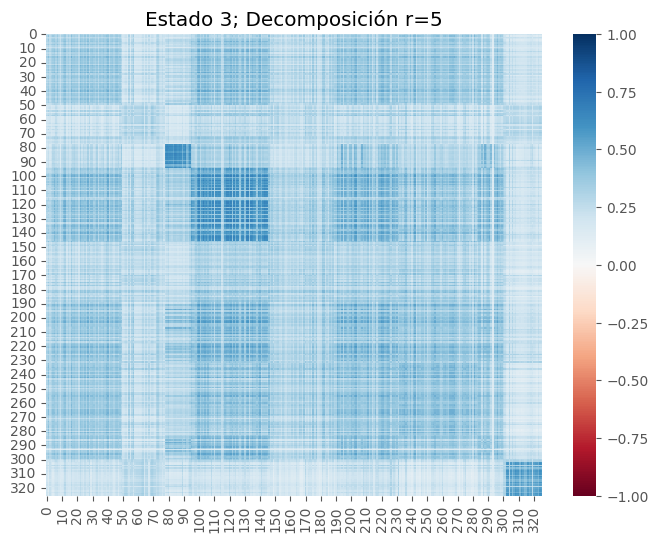

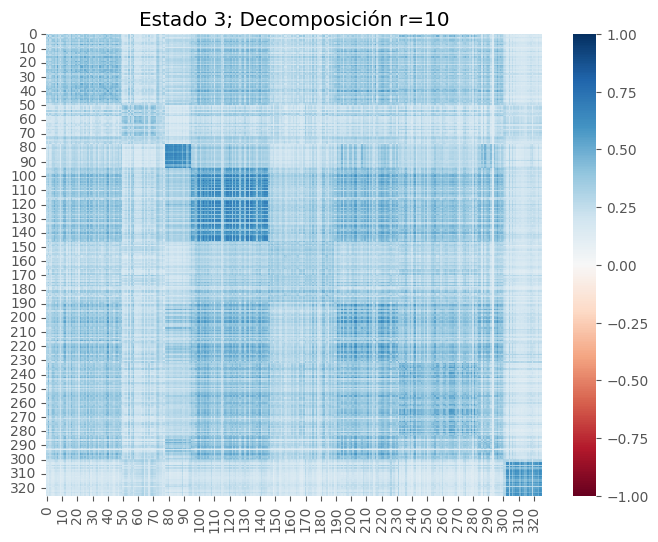

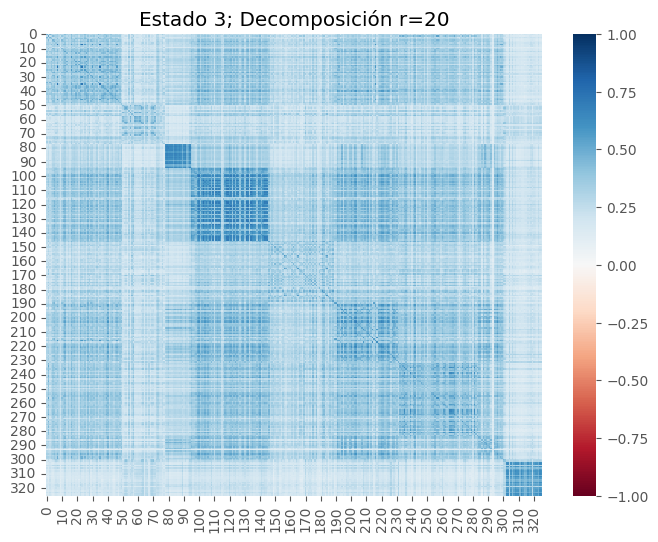

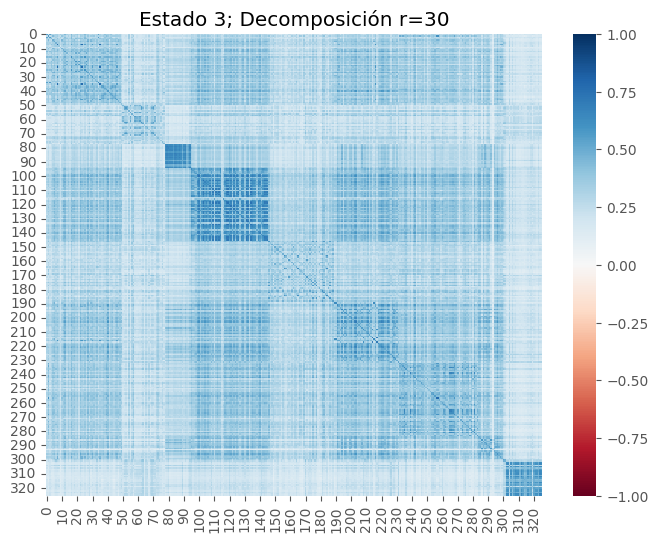

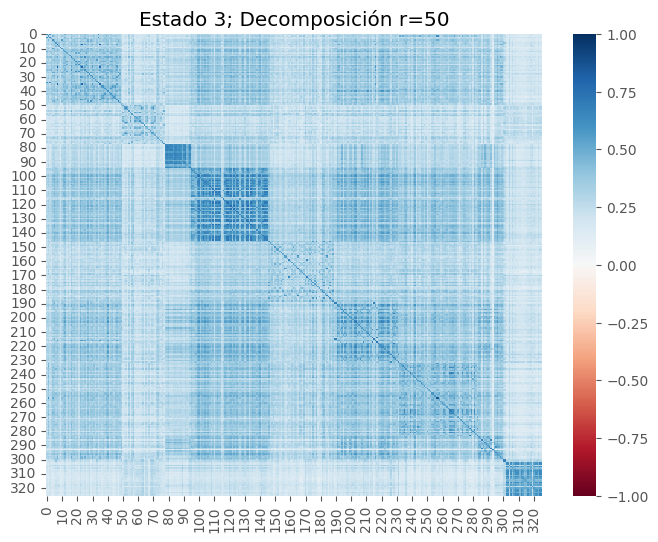

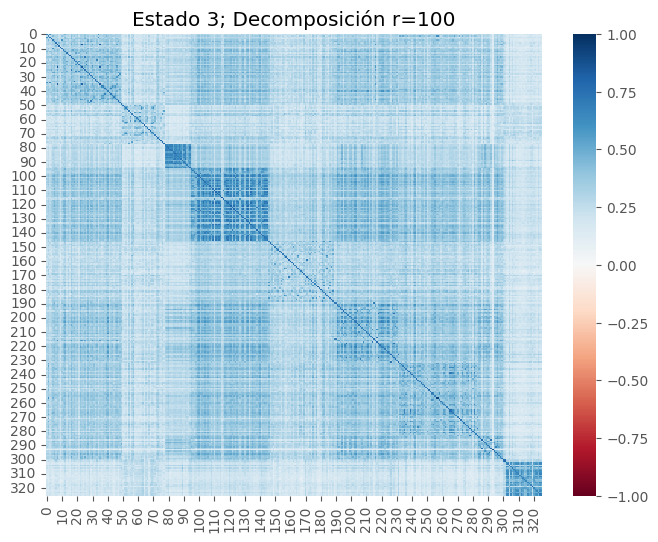

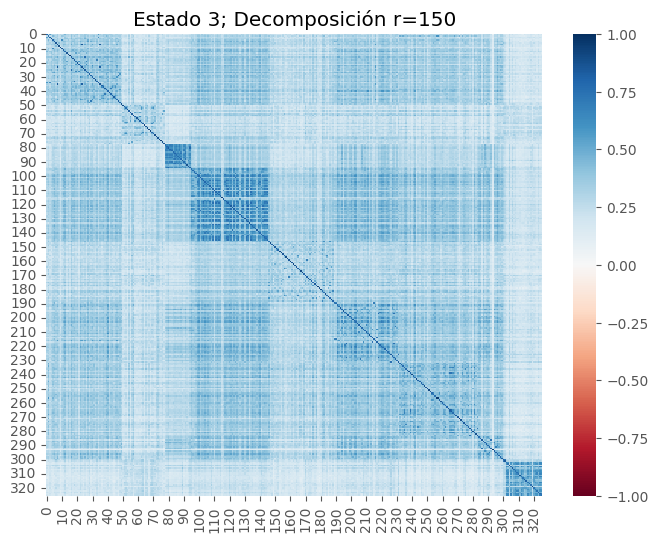

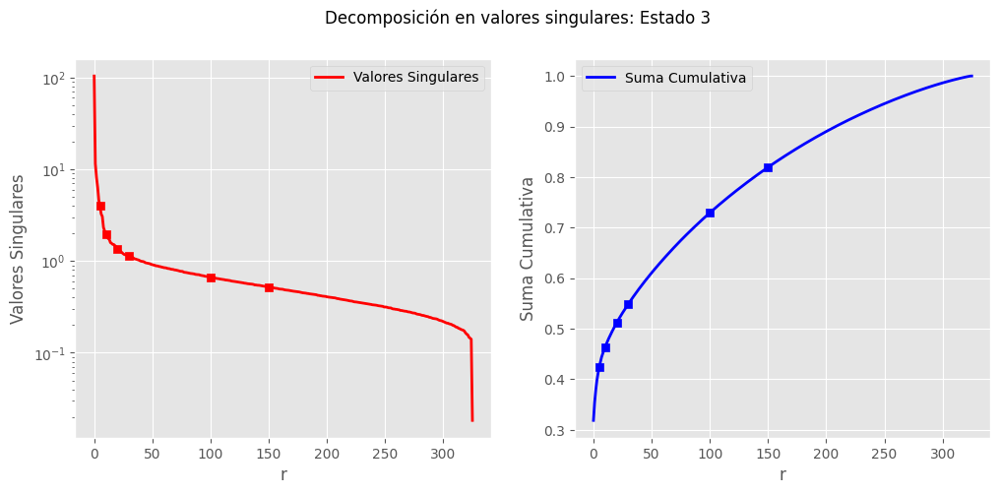

In [ ]:
U, S, VT = np.linalg.svd(mean_correlation_matrix_df5, full_matrices=False)

S = np.diag(S)

for r in (5, 10, 20, 30, 50, 100, 150):
  Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
  plt.figure(figsize=(8,6))
  sns.heatmap(Xapprox, cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"Estado 3; Decomposición r={r}")
  plt.savefig(f'estado_3_SVDr{r}.png')
  plt.show()



scatter_points = [5, 10, 20, 30, 100, 150]
scatter_values = [S[point][point] for point in scatter_points]
scatter_values_2 = [(np.cumsum(np.diag(S))/np.sum(np.diag(S)))[point] for point in scatter_points]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(scatter_points, scatter_values, marker='s', color='red')
plt.semilogy(np.diag(S), linewidth=2, color='red', label='Valores Singulares')
plt.legend()
plt.ylabel('Valores Singulares')
plt.xlabel('r');

plt.subplot(1, 2, 2)
plt.scatter(scatter_points, scatter_values_2, marker='s', color='blue')
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)), linewidth=2, color='blue', label='Suma Cumulativa')
plt.legend()
plt.ylabel('Suma Cumulativa')
plt.xlabel('r');

plt.suptitle('Decomposición en valores singulares: Estado 3');
plt.savefig('SVD_Estado_3.png')

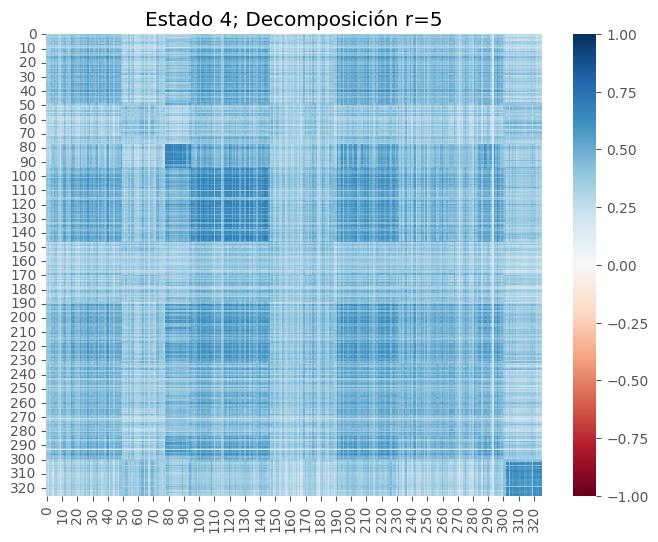

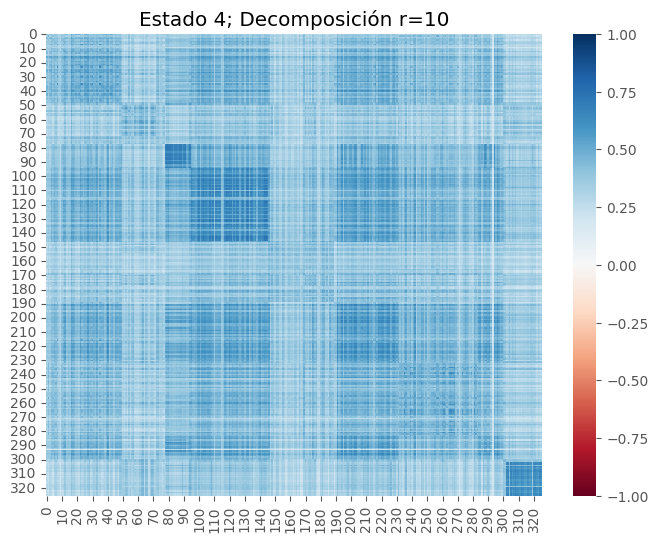

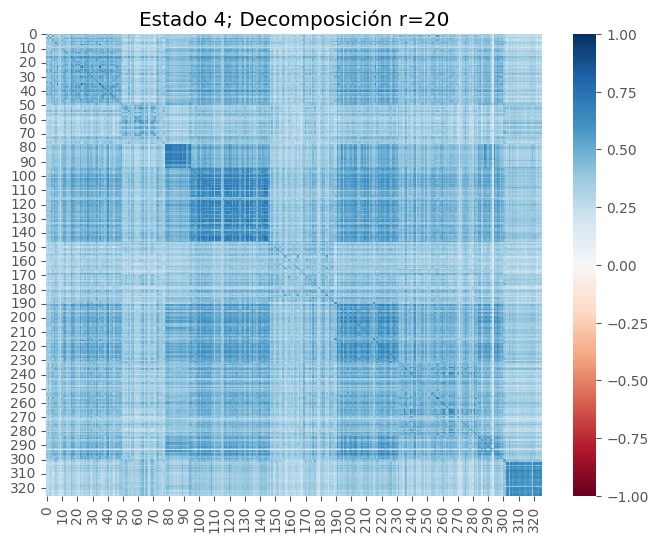

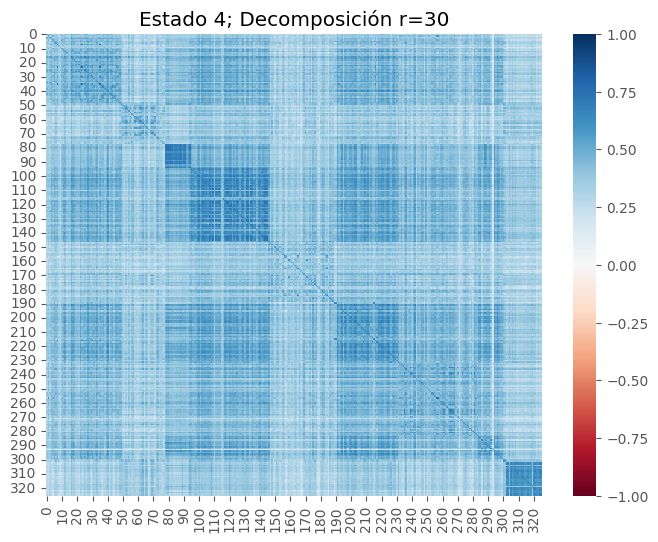

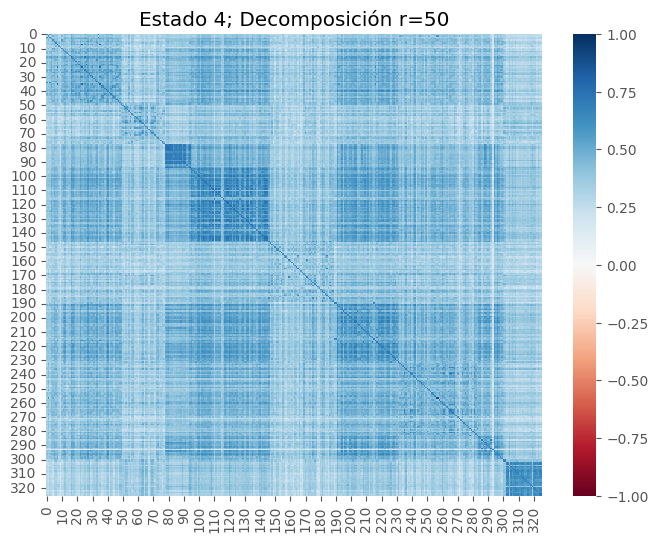

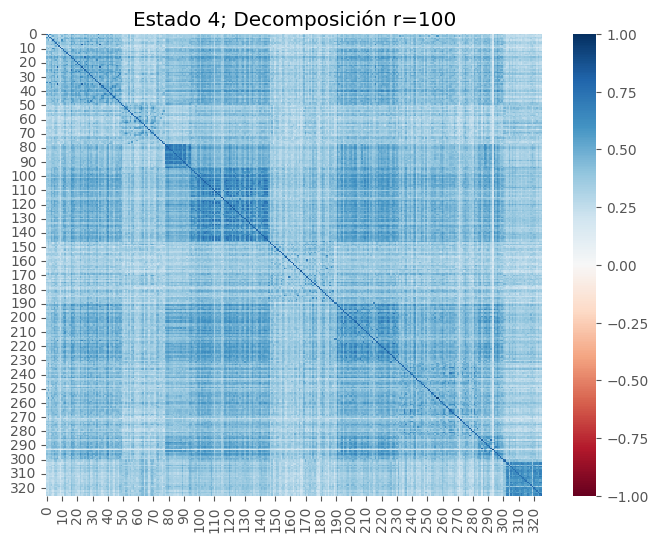

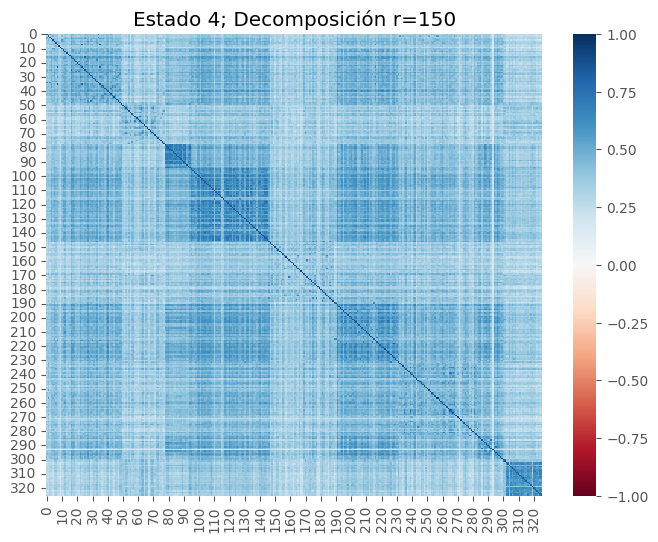

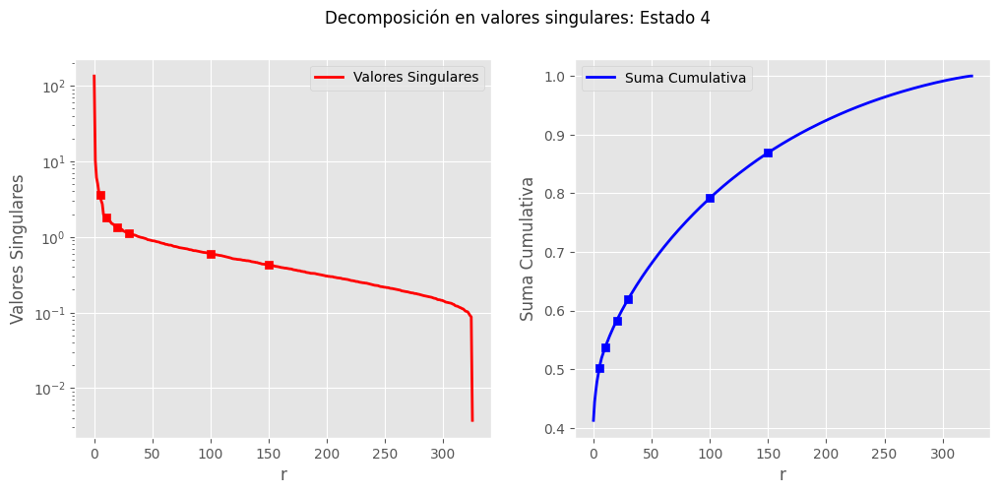

In [ ]:
U, S, VT = np.linalg.svd(mean_correlation_matrix_df2, full_matrices=False)

S = np.diag(S)

for r in (5, 10, 20, 30, 50, 100, 150):
  Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
  plt.figure(figsize=(8,6))
  sns.heatmap(Xapprox, cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"Estado 4; Decomposición r={r}")
  plt.savefig(f'estado_4_SVDr{r}.png')
  plt.show()



scatter_points = [5, 10, 20, 30, 100, 150]
scatter_values = [S[point][point] for point in scatter_points]
scatter_values_2 = [(np.cumsum(np.diag(S))/np.sum(np.diag(S)))[point] for point in scatter_points]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(scatter_points, scatter_values, marker='s', color='red')
plt.semilogy(np.diag(S), linewidth=2, color='red', label='Valores Singulares')
plt.legend()
plt.ylabel('Valores Singulares')
plt.xlabel('r');

plt.subplot(1, 2, 2)
plt.scatter(scatter_points, scatter_values_2, marker='s', color='blue')
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)), linewidth=2, color='blue', label='Suma Cumulativa')
plt.legend()
plt.ylabel('Suma Cumulativa')
plt.xlabel('r');

plt.suptitle('Decomposición en valores singulares: Estado 4');
plt.savefig('SVD_Estado_4.png')

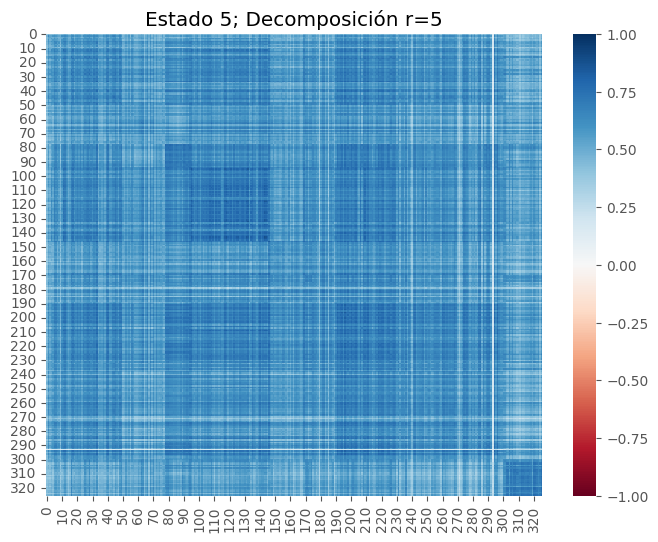

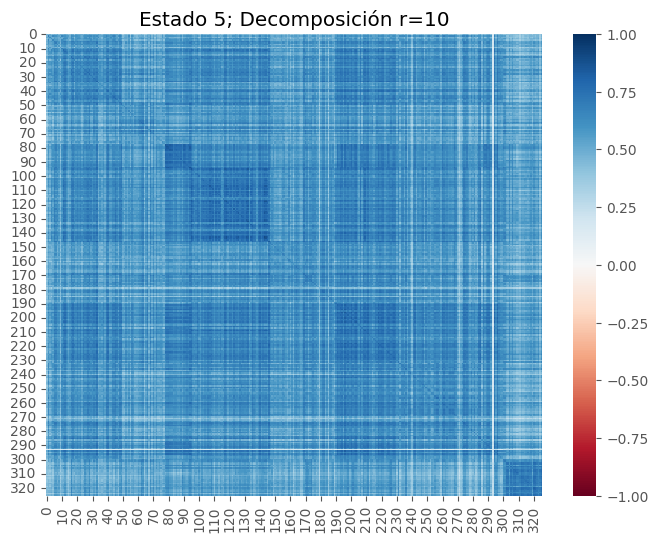

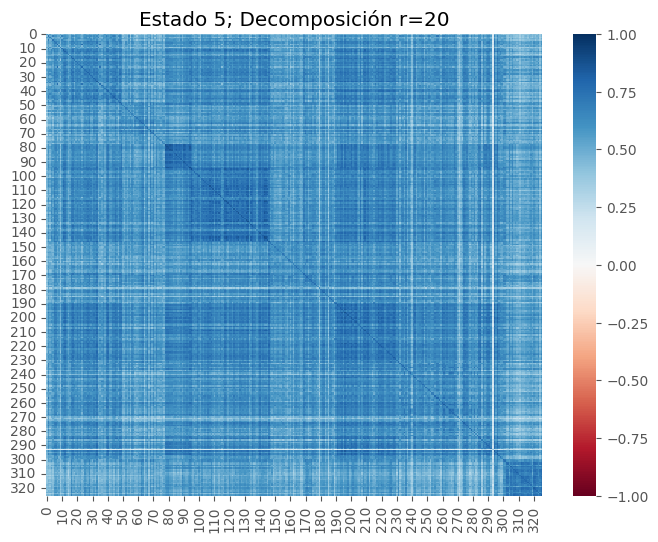

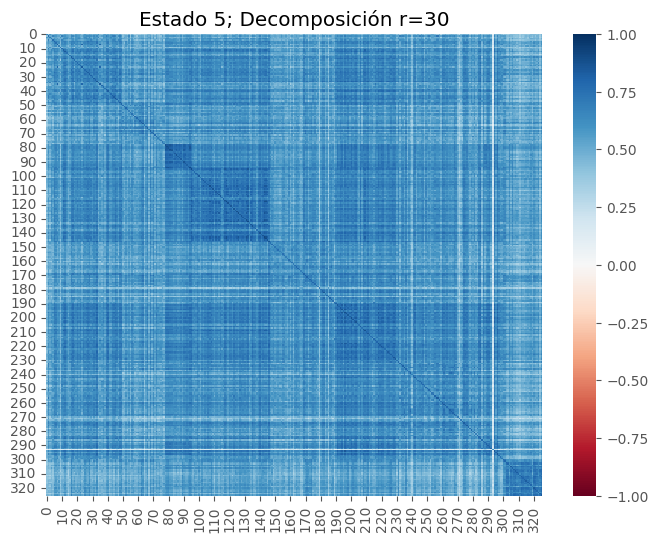

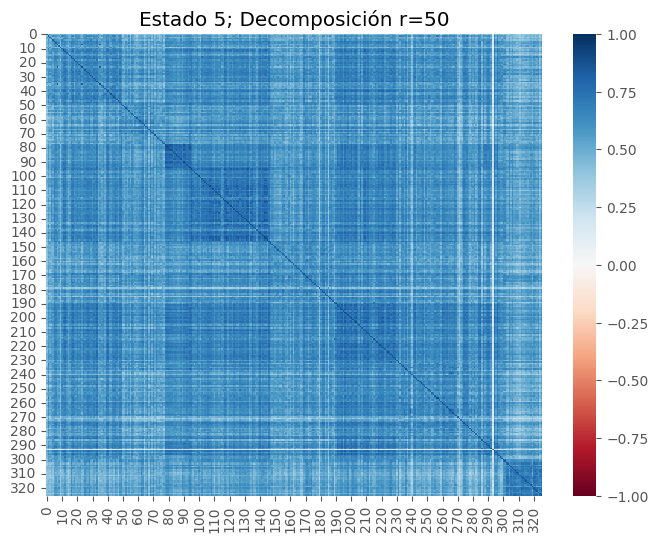

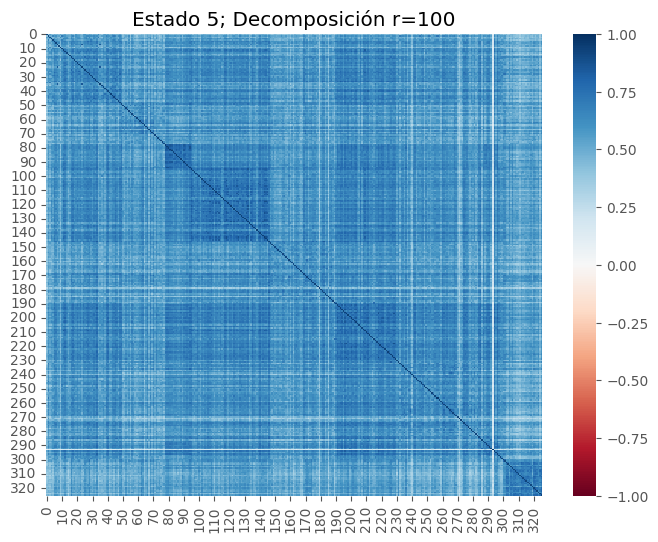

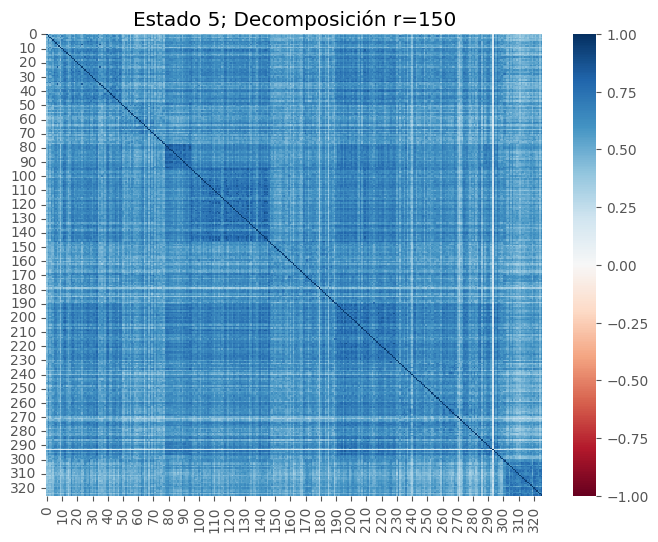

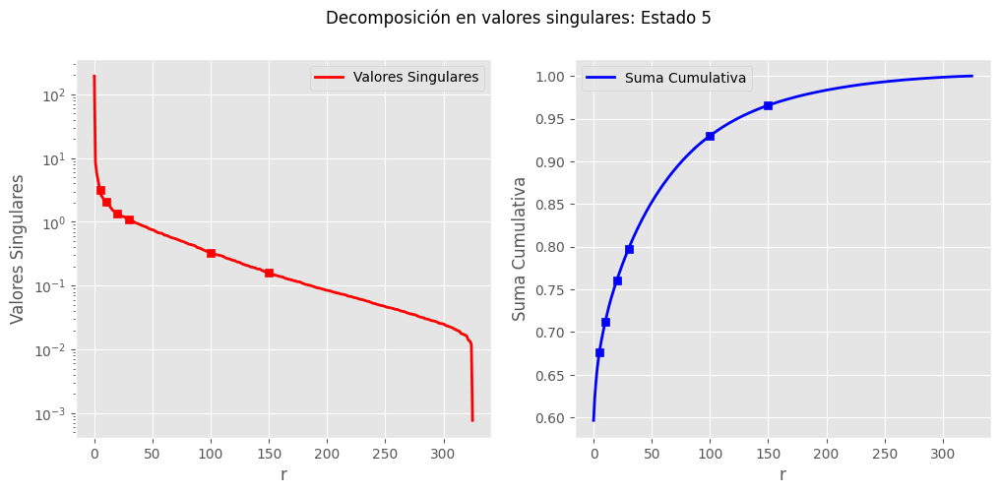

In [ ]:
U, S, VT = np.linalg.svd(mean_correlation_matrix_df4, full_matrices=False)

S = np.diag(S)

for r in (5, 10, 20, 30, 50, 100, 150):
  Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
  plt.figure(figsize=(8,6))
  sns.heatmap(Xapprox, cmap='RdBu', vmin=-1.0, vmax=1.0)
  plt.title(f"Estado 5; Decomposición r={r}")
  plt.savefig(f'estado_5_SVDr{r}.png')
  plt.show()



scatter_points = [5, 10, 20, 30, 100, 150]
scatter_values = [S[point][point] for point in scatter_points]
scatter_values_2 = [(np.cumsum(np.diag(S))/np.sum(np.diag(S)))[point] for point in scatter_points]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(scatter_points, scatter_values, marker='s', color='red')
plt.semilogy(np.diag(S), linewidth=2, color='red', label='Valores Singulares')
plt.legend()
plt.ylabel('Valores Singulares')
plt.xlabel('r');

plt.subplot(1, 2, 2)
plt.scatter(scatter_points, scatter_values_2, marker='s', color='blue')
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)), linewidth=2, color='blue', label='Suma Cumulativa')
plt.legend()
plt.ylabel('Suma Cumulativa')
plt.xlabel('r');

plt.suptitle('Decomposición en valores singulares: Estado 5');
plt.savefig('SVD_Estado_5.png')

In [ ]:
UpperTriangularValues = np.load("/content/drive/MyDrive/DataTesis/UpperTriangularValues.npy")

In [ ]:
UpperTriangularValues = UpperTriangularValues.T
UpperTriangularValues.shape

(4191, 52975)

In [ ]:
#Load the cluster data obtained in the previous section.
clusters = pd.read_csv('clusters.csv')
clusters.drop(columns='Unnamed: 0', inplace=True)
clusters.head(3)

,Cluster
0,1
1,1
2,1


In [ ]:
clusters = np.array(clusters)
clusters.shape

(4191, 1)

In [ ]:
X = data.iloc[:4191]
X_array = np.array(X)
data_index = data.index
X_array.shape

(4191, 326)

In [ ]:
U, S, VT = np.linalg.svd(UpperTriangularValues,full_matrices=0)

In [ ]:
print("U matrix", U.shape) # Spatial patterns in time.
print("VT matrix", VT.shape) # Temporal patterns

U matrix (4191, 4191)
VT matrix (4191, 52975)


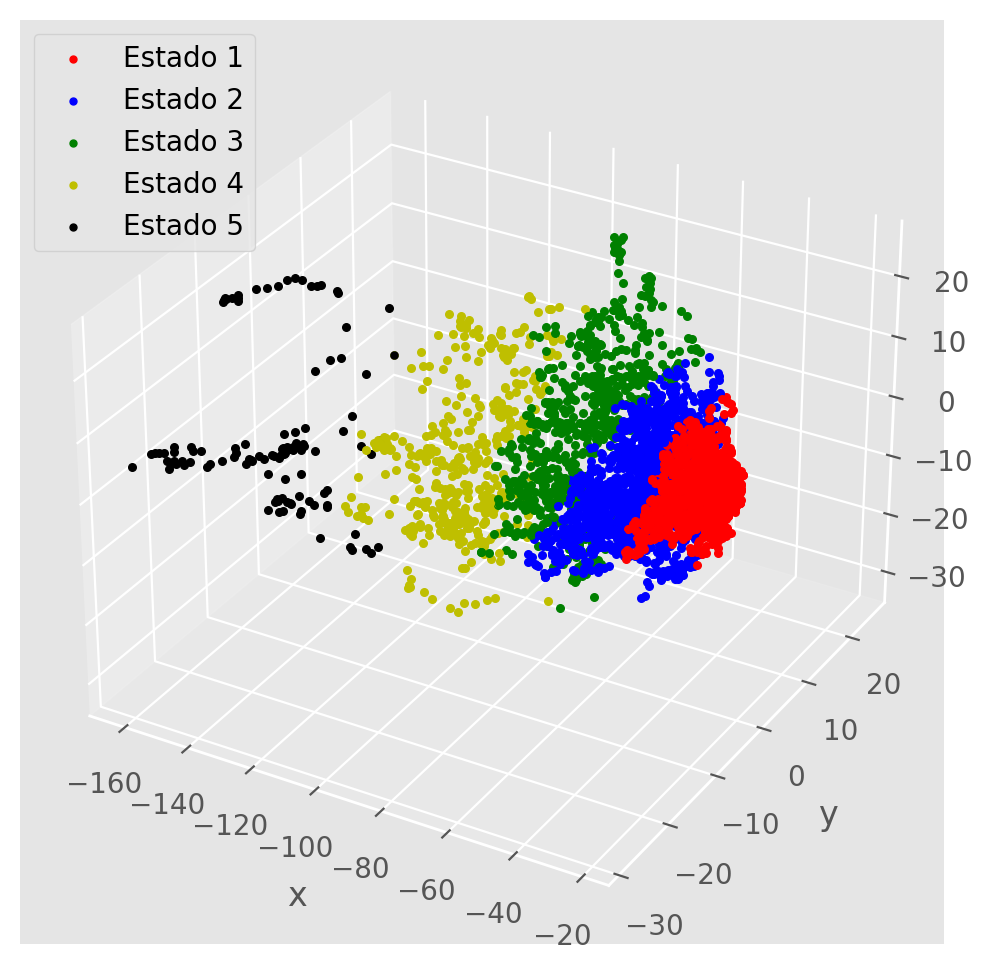

In [ ]:
fig = plt.figure(figsize=(8,6),dpi=200)
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(UpperTriangularValues.shape[0]):
  x = VT[0,:] @ UpperTriangularValues[j,:].T
  y = VT[1,:] @ UpperTriangularValues[j,:].T
  z = VT[2,:] @ UpperTriangularValues[j,:].T
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)

  if clusters[j] == 1:
    ax.scatter(x,y,z,marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z,marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z,marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z,marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z,marker='.', color='k', s=30)

ax.scatter(-142, 10, 0, marker='.', color='r', s=25, label='Estado 1')
ax.scatter(-142, 10, 0, marker='.', color='b', s=25, label='Estado 2')
ax.scatter(-142, 10, 0, marker='.', color='g', s=25, label='Estado 3')
ax.scatter(-142, 10, 0, marker='.', color='y', s=25, label='Estado 4')
ax.scatter(-142, 10, 0, marker='.', color='k', s=25, label='Estado 5')
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
plt.legend(fontsize='medium', loc='upper left')
plt.show()

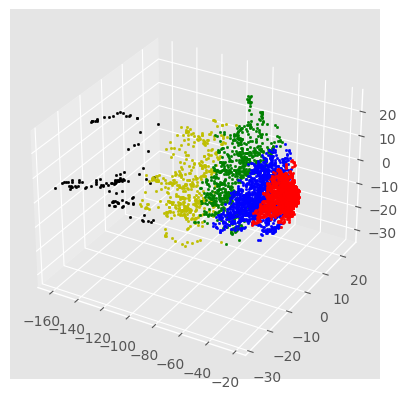

In [ ]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(UpperTriangularValues.shape[0]):
  x = VT[0,:] @ UpperTriangularValues[j,:].T
  y = VT[1,:] @ UpperTriangularValues[j,:].T
  z = VT[2,:] @ UpperTriangularValues[j,:].T
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=20)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=20)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=20)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=20)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=20)

plt.show()

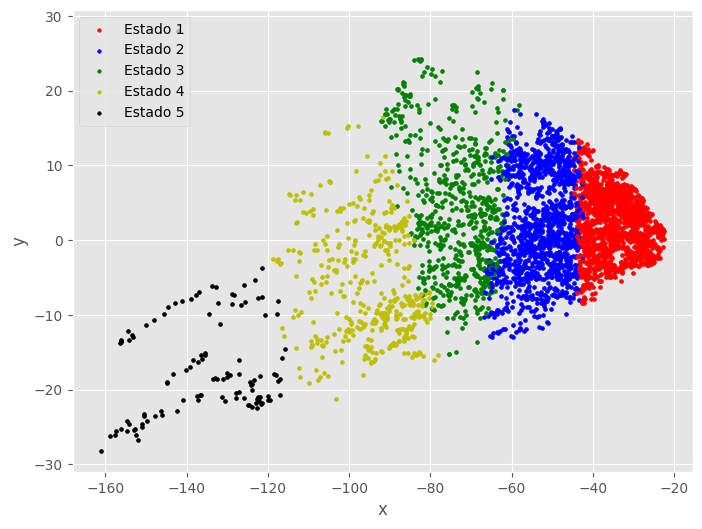

In [ ]:
plt.figure(figsize=(8,6))

for j in range(4191):
  if clusters[j] == 1:
    plt.scatter(X_coor[j], Y_coor[j], marker='.', color='r', s=30)
  elif clusters[j] == 2:
    plt.scatter(X_coor[j], Y_coor[j], marker='.', color='b', s=30)
  elif clusters[j] == 3:
    plt.scatter(X_coor[j], Y_coor[j], marker='.', color='g', s=30)
  elif clusters[j] == 4:
    plt.scatter(X_coor[j], Y_coor[j], marker='.', color='y', s=30)
  elif clusters[j] == 5:
    plt.scatter(X_coor[j], Y_coor[j], marker='.', color='k', s=30)

plt.scatter(-142, 28, marker='.', color='r', s=25, label='Estado 1')
plt.scatter(-142, 28, marker='.', color='b', s=25, label='Estado 2')
plt.scatter(-142, 28, marker='.', color='g', s=25, label='Estado 3')
plt.scatter(-142, 28, marker='.', color='y', s=25, label='Estado 4')
plt.scatter(-142, 28, marker='.', color='k', s=25, label='Estado 5')
plt.xlabel("x")
plt.ylabel("y")
plt.legend(fontsize='medium', loc='upper left')
plt.show()

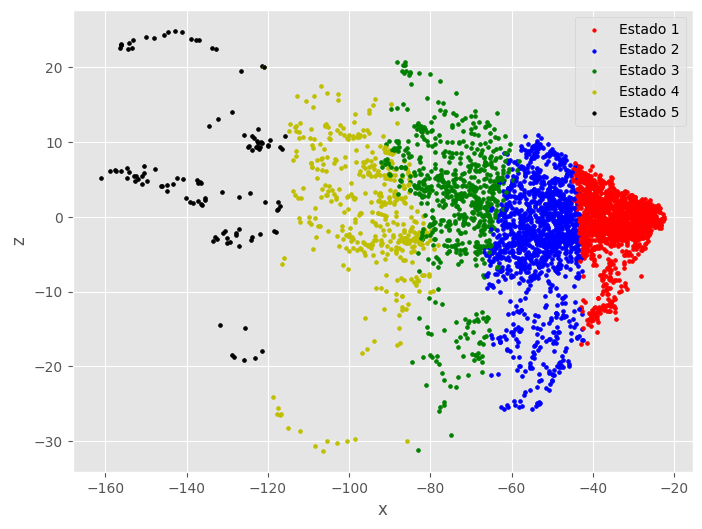

In [ ]:
plt.figure(figsize=(8,6))

for j in range(4191):
  if clusters[j] == 1:
    plt.scatter(X_coor[j], Z_coor[j], marker='.', color='r', s=30)
  elif clusters[j] == 2:
    plt.scatter(X_coor[j], Z_coor[j], marker='.', color='b', s=30)
  elif clusters[j] == 3:
    plt.scatter(X_coor[j], Z_coor[j], marker='.', color='g', s=30)
  elif clusters[j] == 4:
    plt.scatter(X_coor[j], Z_coor[j], marker='.', color='y', s=30)
  elif clusters[j] == 5:
    plt.scatter(X_coor[j], Z_coor[j], marker='.', color='k', s=30)

plt.scatter(-121, 20, marker='.', color='r', s=25, label='Estado 1')
plt.scatter(-121, 20, marker='.', color='b', s=25, label='Estado 2')
plt.scatter(-121, 20, marker='.', color='g', s=25, label='Estado 3')
plt.scatter(-121, 20, marker='.', color='y', s=25, label='Estado 4')
plt.scatter(-121, 20, marker='.', color='k', s=25, label='Estado 5')
plt.xlabel("x")
plt.ylabel("z")
plt.legend(fontsize='medium', loc='upper right')
plt.show()

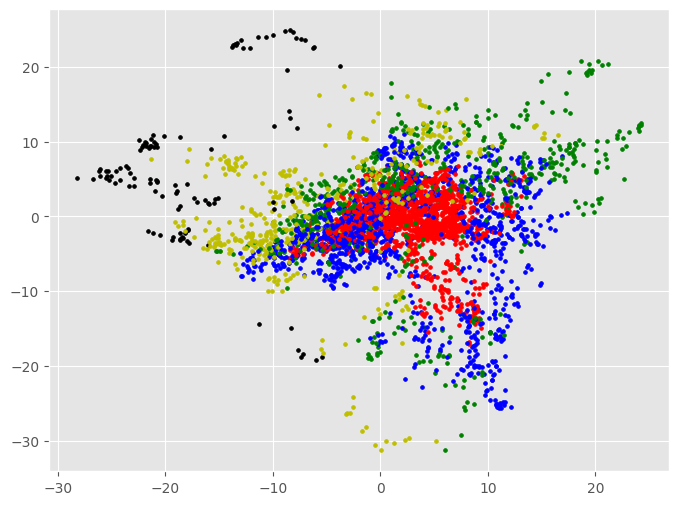

In [ ]:
plt.figure(figsize=(8,6))

for j in range(4191):
  if clusters[j] == 1:
    plt.scatter(Y_coor[j], Z_coor[j], marker='.', color='r', s=30)
  elif clusters[j] == 2:
    plt.scatter(Y_coor[j], Z_coor[j], marker='.', color='b', s=30)
  elif clusters[j] == 3:
    plt.scatter(Y_coor[j], Z_coor[j], marker='.', color='g', s=30)
  elif clusters[j] == 4:
    plt.scatter(Y_coor[j], Z_coor[j], marker='.', color='y', s=30)
  elif clusters[j] == 5:
    plt.scatter(Y_coor[j], Z_coor[j], marker='.', color='k', s=30)

plt.show()

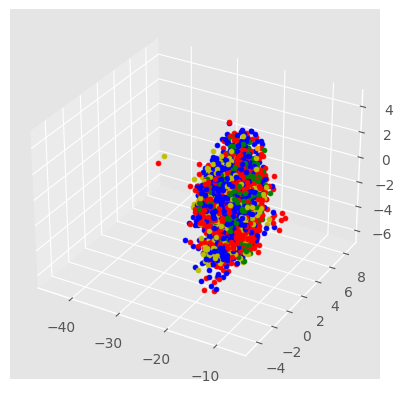

In [ ]:
fig = plt.figure()  # This result is not relevant but now I can discard to project the first three (row/column)vectors of the U matrix.
ax = fig.add_subplot(111, projection='3d')

for j in range(UpperTriangularValues.shape[0]):
  x = U[:,0] @ UpperTriangularValues[:,j]
  y = U[:,1] @ UpperTriangularValues[:,j]
  z = U[:,2] @ UpperTriangularValues[:,j]

  if clusters[j] == 1:
    ax.scatter(x,y,z,marker='.', color='r', s=50)
  elif clusters[j] == 2:
    ax.scatter(x,y,z,marker='.', color='b', s=50)
  elif clusters[j] == 3:
    ax.scatter(x,y,z,marker='.', color='y', s=50)
  elif clusters[j] == 4:
    ax.scatter(x,y,z,marker='.', color='g', s=50)
  elif clusters[j] == 5:
    ax.scatter(x,y,z,marker='.', color='k', s=50)


plt.show()

In [ ]:
#X_array = X.to_numpy() #Performing svd oer the crude data (without centralized)
U, S, VT = np.linalg.svd(X_array,full_matrices=0)

In [ ]:
print("U matrix", U.shape)
print("VT matrix", VT.shape)
print("X_array", X_array.shape)

U matrix (4191, 326)
VT matrix (326, 326)
X_array (4191, 326)


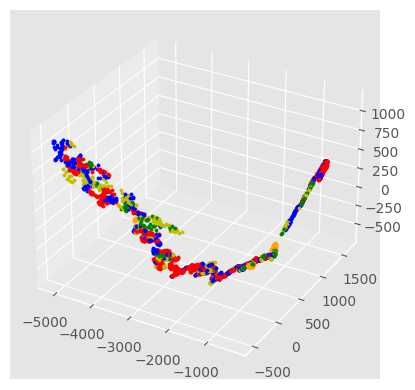

In [ ]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

for j in range(X_array.shape[0]):
  x = VT[0,:] @ X_array[j,:].T
  y = VT[1,:] @ X_array[j,:].T
  z = VT[2,:] @ X_array[j,:].T

  if clusters[j] == 1:
    ax.scatter(x,y,z,marker='.', color='r', s=20)
  elif clusters[j] == 2:
    ax.scatter(x,y,z,marker='.', color='b', s=20)
  elif clusters[j] == 3:
    ax.scatter(x,y,z,marker='.', color='y', s=20)
  elif clusters[j] == 4:
    ax.scatter(x,y,z,marker='.', color='g', s=20)
  elif clusters[j] == 5:
    ax.scatter(x,y,z,marker='.', color='k', s=20)

plt.show()

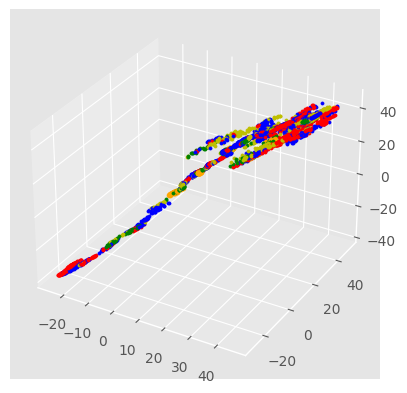

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for j in range(X_array.shape[0]):
  x = U[0,:] @ X_array[j,:].T
  y = U[1,:] @ X_array[j,:].T
  z = U[2,:] @ X_array[j,:].T

  if clusters[j] == 1:
    ax.scatter(x,y,z,marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z,marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z,marker='.', color='y', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z,marker='.', color='g', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z,marker='.', color='k', s=30)

plt.show()

In [ ]:
mean = np.mean(X_array, axis=0)
X_centralized = X_array - mean

In [ ]:
X_standardized = (X_array - np.mean(X_array, axis=0)) / np.std(X_array, axis=0)

In [ ]:
U, S, VT = np.linalg.svd(X_standardized, full_matrices=0)

In [ ]:
print("The size of the data centralized is: ", X_standardized.shape)
print("The size of the culsters labels data is: ", clusters.shape)
print("The size of the matrix U: ", U.shape)
print("The size of the matrix VT: ", VT.shape)

The size of the data centralized is:  (4191, 326)
The size of the culsters labels data is:  (4191, 1)
The size of the matrix U:  (4191, 326)
The size of the matrix VT:  (326, 326)


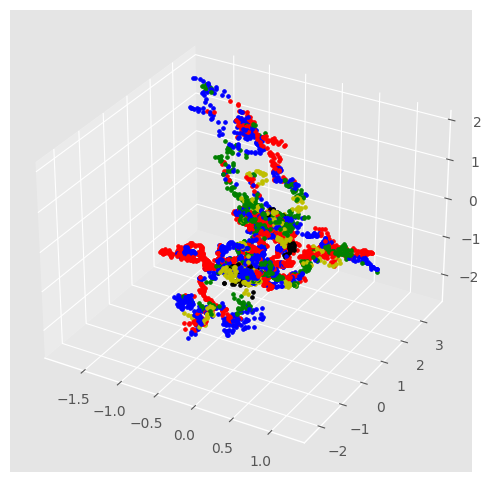

In [ ]:
# Using VT matrix
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_standardized.shape[0]):
  x = VT[:,0] @ X_standardized[j,:]
  y = VT[:,1] @ X_standardized[j,:]
  z = VT[:,2] @ X_standardized[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)

plt.show()

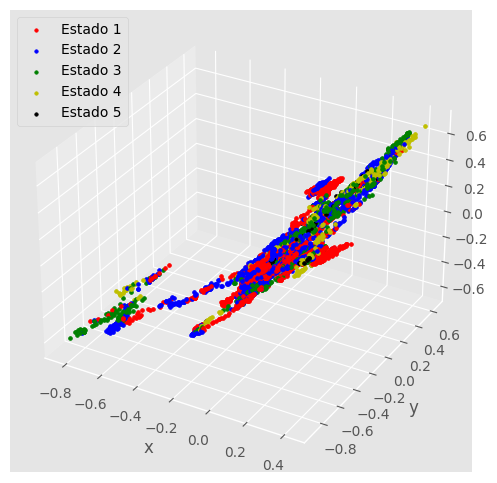

In [ ]:
# Using U matrix
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_standardized.shape[0]):
  x = U[0,:] @ X_standardized[j,:]
  y = U[1,:] @ X_standardized[j,:]
  z = U[2,:] @ X_standardized[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)

ax.scatter(0, 0, 0, marker='.', color='r', s=25, label='Estado 1')
ax.scatter(0, 0, 0, marker='.', color='b', s=25, label='Estado 2')
ax.scatter(0, 0, 0, marker='.', color='g', s=25, label='Estado 3')
ax.scatter(0, 0, 0, marker='.', color='y', s=25, label='Estado 4')
ax.scatter(0, 0, 0, marker='.', color='k', s=25, label='Estado 5')
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
plt.legend(fontsize='medium', loc='upper left')
plt.show()

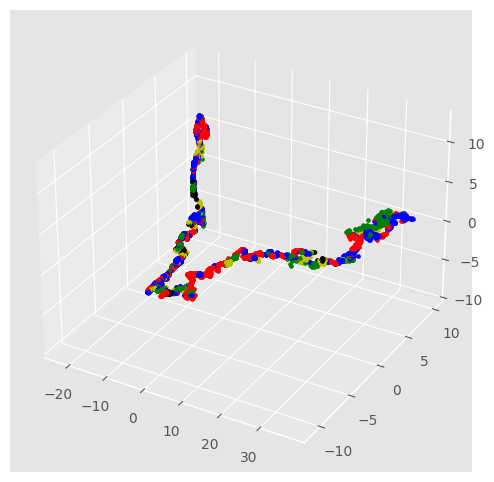

In [ ]:
# Using VT matrix
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_standardized.shape[0]):
  x = VT[0,:] @ X_standardized[j,:]
  y = VT[1,:] @ X_standardized[j,:]
  z = VT[2,:] @ X_standardized[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)


plt.show()

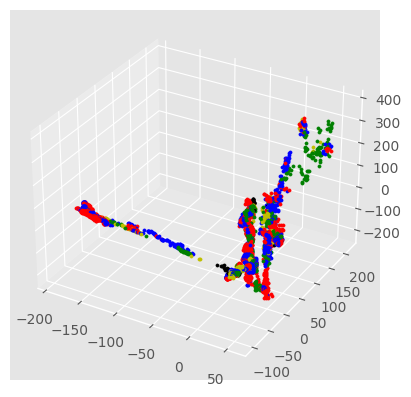

In [ ]:
# Using VT columns
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_centralized.shape[0]):
  x = VT[:,0] @ X_centralized[j,:]
  y = VT[:,1] @ X_centralized[j,:]
  z = VT[:,2] @ X_centralized[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)


plt.show()

In [ ]:
# Computing the covariance matrix and use it as input for the SVD
cov_matrix = np.cov(X_standardized, rowvar=False)
U, S, VT = np.linalg.svd(cov_matrix, full_matrices=0)

In [ ]:
print("The size of the matrix U: ", U.shape)
print("The size of the matrix VT: ", VT.shape)

The size of the matrix U:  (326, 326)
The size of the matrix VT:  (326, 326)


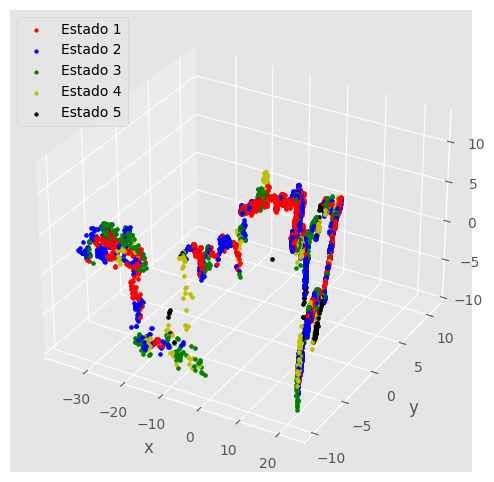

In [ ]:
# Using U columns; check use the rows
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_standardized.shape[0]):
  x = U[:,0] @ X_standardized[j,:]
  y = U[:,1] @ X_standardized[j,:]
  z = U[:,2] @ X_standardized[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)

ax.scatter(0, 0, 0, marker='.', color='r', s=25, label='Estado 1')
ax.scatter(0, 0, 0, marker='.', color='b', s=25, label='Estado 2')
ax.scatter(0, 0, 0, marker='.', color='g', s=25, label='Estado 3')
ax.scatter(0, 0, 0, marker='.', color='y', s=25, label='Estado 4')
ax.scatter(0, 0, 0, marker='.', color='k', s=25, label='Estado 5')
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
plt.legend(fontsize='medium', loc='upper left')
plt.show()

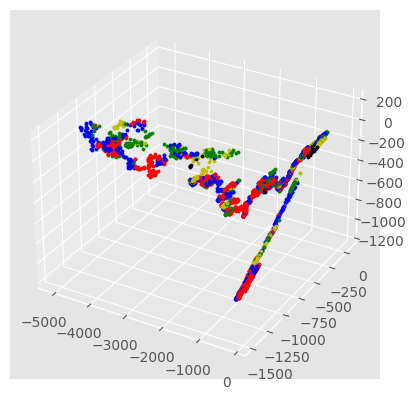

In [ ]:
# Using U columns; check use the rows
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

X_coor = []
Y_coor = []
Z_coor = []

for j in range(X_array.shape[0]):
  x = VT[0,:] @ X_array[j,:]
  y = VT[1,:] @ X_array[j,:]
  z = VT[2,:] @ X_array[j,:]
  X_coor.append(x)
  Y_coor.append(y)
  Z_coor.append(z)


  if clusters[j] == 1:
    ax.scatter(x,y,z, marker='.', color='r', s=30)
  elif clusters[j] == 2:
    ax.scatter(x,y,z, marker='.', color='b', s=30)
  elif clusters[j] == 3:
    ax.scatter(x,y,z, marker='.', color='g', s=30)
  elif clusters[j] == 4:
    ax.scatter(x,y,z, marker='.', color='y', s=30)
  elif clusters[j] == 5:
    ax.scatter(x,y,z, marker='.', color='k', s=30)


plt.show()

# Part 3: Lasso Regression

In [ ]:
clusters = pd.read_csv('clusters.csv')

In [ ]:
X = data[:4191]
y = clusters['Cluster']
y.index = X.index

In [ ]:
print("X size: ", X.shape)
print("y size: ", y.shape)

X size:  (4191, 326)
y size:  (4191,)


In [ ]:
X.head(3)

,AAP_CD,AMZN_CD,AZO_CD,BBY_CD,BKNG_CD,CCL_CD,CMCSA_CD,DHI_CD,DISH_CD,DLTR_CD,...,LNT_UT,NEE_UT,NI_UT,NRG_UT,PEG_UT,PNW_UT,SO_UT,SRE_UT,WEC_UT,XEL_UT
2006-01-03,43.470001,2.3735,91.849998,43.750000,22.320000,53.830002,8.683333,36.459999,27.230000,7.990000,...,14.09,10.4650,8.247544,23.700001,32.750000,41.599998,34.759998,45.040001,19.650000,18.520000
2006-01-04,43.900002,2.3745,92.760002,44.599998,22.750000,54.419998,8.710000,36.830002,28.180000,8.043333,...,14.26,10.5250,8.361493,23.950001,33.375000,42.389999,34.919998,46.250000,20.049999,18.570000
2006-01-05,43.840000,2.3580,91.760002,44.099998,22.940001,54.380001,8.793333,36.400002,28.719999,8.116667,...,14.39,10.4625,8.259332,23.250000,33.450001,42.450001,35.040001,47.000000,19.985001,18.610001


In [ ]:
y.head(3)

2006-01-03    1
2006-01-04    1
2006-01-05    1
Name: Cluster, dtype: int64

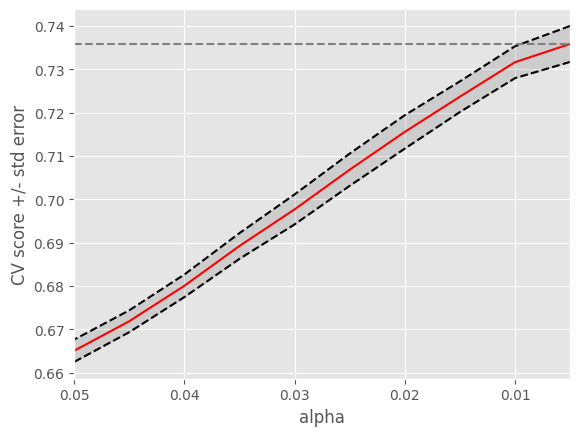

<Figure size 1600x600 with 0 Axes>

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

alphas = np.linspace(0.005, 0.05, 10)

reg = LassoCV(cv=5).fit(X_train, y_train)

lasso = Lasso(random_state=5, max_iter=1000)

tuned_parameters = [{'alpha': alphas}]

clf = GridSearchCV(lasso, tuned_parameters, cv=5, refit=False)
clf.fit(X_train, y_train)

scores = clf.cv_results_['mean_test_score']
scores_std = clf.cv_results_['std_test_score']
plt.plot(alphas, scores,'r-')

std_error = scores_std / np.sqrt(5)

#plt.figure(figsize=(10,6))
plt.plot(alphas, scores + std_error, 'k--')
plt.plot(alphas, scores - std_error, 'k--')
plt.fill_between(alphas, scores + std_error, scores - std_error, alpha=0.1, color='k')
plt.ylabel('CV score +/- std error')
plt.xlabel('alpha')
plt.axhline(np.max(scores), linestyle='--', color='.5')
plt.xlim([alphas[-1], alphas[0]])

plt.show()

I deal with the stock prices data set first.

In [ ]:
scaler = StandardScaler()
#scaler = MinMaxScaler()
#scaler = RobustScaler()

X_scaled = scaler.fit_transform(X)

In [ ]:
# MSE y CV:
tscv = TimeSeriesSplit(n_splits=4)
mse_scores = []

for train_index, test_index in tscv.split(X_scaled):
    X_train, X_test = X_scaled[train_index[0]:train_index[-1]], X_scaled[test_index[0]:test_index[-1]]
    y_train, y_test = y[train_index[0]:train_index[-1]], y[test_index[0]:test_index[-1]]

    lasso.fit(X_train, y_train)
    predicted_labels = lasso.predict(X_test)

    mse = mean_squared_error(y_test, predicted_labels)
    mse_scores.append(mse)


mean_mse = np.mean(mse_scores)

print("Mean Squared Error:", mean_mse)

Mean Squared Error: 3.6113930782887413


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=5)

lasso = Lasso(alpha=0.01)
lasso.fit(X_train, y_train)

predicted_labels = lasso.predict(X_test)

important_features = [index for index, coef in enumerate(lasso.coef_) if coef != 0]
print("Important Features (Stocks):", X.columns[important_features])
print("Number of relevant stocks:", len(important_features))

Important Features (Stocks): Index(['BBY_CD', 'DLTR_CD', 'F_CD', 'KMX_CD', 'KSS_CD', 'MGM_CD', 'MHK_CD',
       'RL_CD', 'TPR_CD', 'WYNN_CD', 'K_CS', 'MDLZ_CS', 'MO_CS', 'FTI_EG',
       'HAL_EG', 'VLO_EG', 'WMB_EG', 'XOM_EG', 'AMG_FN', 'AXP_FN', 'GS_FN',
       'MS_FN', 'MTB_FN', 'PRU_FN', 'UNM_FN', 'DGX_HC', 'INCY_HC', 'PRGO_HC',
       'UHS_HC', 'AAL_ID', 'CHRW_ID', 'EMR_ID', 'FLS_ID', 'GE_ID', 'JCI_ID',
       'DXC_IT', 'EA_IT', 'HPQ_IT', 'IBM_IT', 'NVDA_IT', 'WDC_IT', 'FCX_MT',
       'MOS_MT', 'SEE_MT', 'T_TC', 'VZ_TC', 'AES_UT', 'EIX_UT', 'FE_UT',
       'NRG_UT'],
      dtype='object')
Number of relevant stocks: 50


In [ ]:
predicted_labels = np.round(predicted_labels)
count = predicted_labels - y_test
count_zeros = (count==0).sum()
count_zeros/len(y_test)

0.4755661501787843

In [ ]:
for i in range(len(important_features)):
  plt.plot(X[stock_names[i]], label=f'{stock_names[i]}')
  plt.legend()
  plt.show()

Now i deal with the pair of correlations data set.

In [ ]:
#y_corr = y.to_numpy()
X_corr = UpperTriangularValues
X_corr.shape

In [ ]:
# MSE y CV:
tscv = TimeSeriesSplit(n_splits=4)
mse_scores = []
for train_index, test_index in tscv.split(X_corr):
    X_train, X_test = X_corr[train_index[0]:train_index[-1]], X_corr[test_index[0]:test_index[-1]]
    y_train, y_test = y[train_index[0]:train_index[-1]], y[test_index[0]:test_index[-1]]

    lasso.fit(X_train, y_train)
    predicted_labels = lasso.predict(X_test)

    mse = mean_squared_error(y_test, predicted_labels)
    mse_scores.append(mse)


mean_mse = np.mean(mse_scores)

print("Mean Squared Error:", mean_mse)

Mean Squared Error: 0.20617641494929756


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_corr, y, test_size=0.2, random_state=5)

lasso = Lasso(alpha=0.01)
lasso.fit(X_train, y_train)

predicted_labels = lasso.predict(X_test)

important_features = [index for index, coef in enumerate(lasso.coef_) if coef != 0]
print("Important Correlations:", important_features)
print("Number of relevant Correlations:", len(important_features))

Important Correlations: [3773, 3789, 4020, 5080, 5111, 5117, 5152, 5232, 5254, 5272, 5281, 5406, 5798, 7319, 7342, 7826, 8020, 8431, 8438, 8565, 8638, 8695, 8731, 8884, 8987, 9214, 10203, 10243, 10288, 10300, 10309, 10366, 10384, 10391, 10452, 10888, 10985, 11360, 11934, 11942, 12001, 12010, 12095, 12101, 12124, 12284, 12311, 12454, 12480, 13249, 13714, 14245, 14518, 14550, 14567, 14778, 14923, 18600, 19048, 19885, 20477, 20851, 20871, 20903, 21323, 22732, 22884, 22900, 23048, 23107, 23205, 24023, 24115, 24258, 24586, 24815, 24957, 24977, 25849, 25889, 26180, 26293, 26352, 26390, 26515, 26534, 27450, 27465, 27569, 27630, 27653, 27675, 27695, 27717, 27724, 28127, 28132, 28158, 28351, 28378, 28386, 28458, 28484, 28566, 28585, 28760, 29118, 29197, 29209, 29258, 29302, 29473, 29519, 29655, 31000, 31383, 31674, 31919, 32124, 32437, 32633, 32793, 32967, 33033, 33387, 33866, 33965, 34159, 34334, 34412, 34918, 35864, 36041, 36222, 36479, 36601, 36627, 36869, 36926, 36959, 36963, 36986, 37007, 

In [ ]:
predicted_labels = np.round(predicted_labels)
count = predicted_labels - y_test
count_zeros = (count==0).sum()
count_zeros/len(y_test)

0.9213349225268176

In [ ]:
stock_indices = range(326)
pairs = list(itertools.combinations(stock_indices,2))

column_pair_mapping = {}
column_index = 0
for pair in pairs:
    column_pair_mapping[pair] = column_index
    column_index += 1

column_pair_mapping = {value: key for key, value in column_pair_mapping.items()}
pair = column_pair_mapping[3773]
stock1_index, stock2_index = pair

print(stock_names[stock1_index], stock_names[stock2_index])
# Termina para pares de acciones
#######################################################

In [ ]:
def stock_pairs(i):
  stock_indices = range(326)
  pairs = list(itertools.combinations(stock_indices,2))

  column_pair_mapping = {}
  column_index = 0
  for pair in pairs:
      column_pair_mapping[pair] = column_index
      column_index += 1

  column_pair_mapping = {value: key for key, value in column_pair_mapping.items()}
  pair = column_pair_mapping[i]
  stock1_index, stock2_index = pair

  print("(",stock_names[stock1_index],stock_names[stock2_index],")")

In [ ]:
Important_Correlations = [3773, 3789, 4020, 5080, 5111, 5117, 5152, 5232, 5254, 5272, 5281, 5406, 5798, 7319, 7342, 7826, 8020, 8431, 8438, 8565, 8638, 8695, 8731, 8884, 8987, 9214, 10203, 10243, 10288, 10300, 10309, 10366, 10384, 10391, 10452, 10888, 10985, 11360, 11934, 11942, 12001, 12010, 12095, 12101, 12124, 12284, 12311, 12454, 12480, 13249, 13714, 14245, 14518, 14550, 14567, 14778, 14923, 18600, 19048, 19885, 20477, 20851, 20871, 20903, 21323, 22732, 22884, 22900, 23048, 23107, 23205, 24023, 24115, 24258, 24586, 24815, 24957, 24977, 25849, 25889, 26180, 26293, 26352, 26390, 26515, 26534, 27450, 27465, 27569, 27630, 27653, 27675, 27695, 27717, 27724, 28127, 28132, 28158, 28351, 28378, 28386, 28458, 28484, 28566, 28585, 28760, 29118, 29197, 29209, 29258, 29302, 29473, 29519, 29655, 31000, 31383, 31674, 31919, 32124, 32437, 32633, 32793, 32967, 33033, 33387, 33866, 33965, 34159, 34334, 34412, 34918, 35864, 36041, 36222, 36479, 36601, 36627, 36869, 36926, 36959, 36963, 36986, 37007, 37019, 37302, 37358, 40784, 40804, 41015, 41729, 41737, 41770, 42649, 42697, 42699, 42717, 43335, 43984, 44635, 44856, 44908, 45270, 45324, 45370, 45374, 45375, 45437, 45558, 45567, 45864, 46089, 46207, 46218, 46354, 46369, 46991, 47205, 47224, 47272, 47428, 47547, 47583, 47988, 48093, 48185, 48282, 48283, 49240, 49290, 49409, 49536, 49862, 49914, 50494, 50960, 50961, 51329]

In [ ]:
for i in Important_Correlations:
  stock_pairs(i)

( F_CD KLAC_IT )
( F_CD TXN_IT )
( GPC_CD DE_ID )
( HD_CD HOG_CD )
( HD_CD YUM_CD )
( HD_CD COST_CS )
( HD_CD OKE_EG )
( HD_CD ISRG_HC )
( HD_CD AME_ID )
( HD_CD GE_ID )
( HD_CD NSC_ID )
( HOG_CD PHM_CD )
( IPG_CD L_FN )
( LEN_CD LNC_FN )
( LEN_CD WFC_FN )
( LOW_CD MAR_CD )
( LOW_CD PNR_ID )
( MAR_CD PHM_CD )
( MAR_CD TJX_CD )
( MAR_CD ISRG_HC )
( MAR_CD APH_IT )
( MAR_CD VMC_MT )
( MCD_CD ROST_CD )
( MCD_CD AME_ID )
( MCD_CD NUE_MT )
( MGM_CD ROP_ID )
( OMC_CD SWK_CD )
( OMC_CD CVX_EG )
( OMC_CD MS_FN )
( OMC_CD SIVB_FN )
( OMC_CD A_HC )
( OMC_CD ETN_ID )
( OMC_CD PNR_ID )
( OMC_CD UNP_ID )
( OMC_CD FMC_MT )
( PHM_CD WFC_FN )
( PHM_CD ANSS_IT )
( RL_CD SBUX_CD )
( SBUX_CD SWK_CD )
( SBUX_CD YUM_CD )
( SBUX_CD C_FN )
( SBUX_CD ICE_FN )
( SBUX_CD EFX_ID )
( SBUX_CD FLS_ID )
( SBUX_CD URI_ID )
( SWK_CD BK_FN )
( SWK_CD PRU_FN )
( SWK_CD PAYX_IT )
( SWK_CD VZ_TC )
( TPR_CD PNR_ID )
( VFC_CD MS_FN )
( WYNN_CD AMG_FN )
( YUM_CD AFL_FN )
( YUM_CD NDAQ_FN )
( YUM_CD WFC_FN )
( ADM_CS COP_EG )